# Итоговый проект по курсу OTUS "ML для финансового анализа" 2024-07

### 1. Задача - провести анализ исторических данных котировок криптовалют (на примере ETH) с использованием инструментов машинного обучения и нейронных сетей для предсказания торговых действий на бирже (покупка, продажа)

### 2. Сбор и очистка данных

In [497]:
class COMMON_CONFIG:
    CASH = 1_000_000
    COMMISSION = .002
    SEED = 777
    SYMBOL = 'ETH/USDT'
    TIMEFRAME = '1h'
    START_DATE = '2020-01-01T00:00:00Z'
    VAL_DATA_OFFSET = 18,
    TEST_DATA_OFFSET = 12,
    ML_TARGET_NEXT_PERIOD_OFFSET = -1
    TA_MAX_STAT = 'Profit Factor'
    TA_KOEF = ML_TARGET_NEXT_PERIOD_OFFSET * -1
    TS_FRESH_MIN_WINDOW_SIZE = 5
    TS_FRESH_MAX_WINDOW_SIZE = 60

In [2]:
!pip install matplotlib -q
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

!pip install pandas -q
import pandas as pd
# Хак чтобы работало на Anaconda под MacOs 10.15.7 Catalina
pd.DataFrame.iteritems = pd.DataFrame.items

In [3]:
!pip install plotly -q

import plotly.graph_objects as go

def linear_plot(x, y, title):
    fig = go.Figure([go.Scatter(x = x, y = y, mode='lines')])
    fig.update_layout(plot_bgcolor='white',
                      xaxis_title='Date',
                      yaxis_title='Price',
                      title=title)
    fig.show()

def candlestick_plot(df, title):
    fig = go.Figure([go.Candlestick(x=df.index,
                                open=df['open'],
                                high=df['high'],
                                low=df['low'],
                                close=df['close'])])
    fig.update_layout(xaxis_rangeslider_visible=False,
                      plot_bgcolor='white',
                      xaxis_title='Date',
                      yaxis_title='Price',
                      title=title)
    fig.update_yaxes(fixedrange=False)
    fig.show()

In [538]:
# Plot actual vs predicted labels
def plot(all_predictions, all_targets, title):
    plt.figure(figsize=(12, 6))
    #plt.plot(all_targets[-90:], label='Actual', color='blue', linestyle='--', alpha=0.3)
    plt.plot(all_targets, label='Actual', color='blue', linestyle='--', alpha=0.3)
    #plt.plot(all_predictions[-90:], label='Predicted', color='red', alpha=0.7)
    plt.plot(all_predictions, label='Predicted', color='red', alpha=0.7)
    plt.title(title)
    plt.xlabel("Time Step")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

In [7]:
#!pip install git+https://github.com/kernc/backtesting.py.git -q
!pip install backtesting -q

from backtesting import Backtest, Strategy
from backtesting.lib import crossover
from backtesting.test import SMA

def run_backtest(_test_data, _strategy, plot=True, print_stats=True):
  bt = Backtest(_test_data, _strategy, cash=COMMON_CONFIG.CASH, commission=COMMON_CONFIG.COMMISSION)
  stats = bt.run()
  
  if plot:
    bt.plot()
      
  if print_stats:
    print(stats)
  return stats

In [8]:
!pip install torch -q

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

In [9]:
import os
os.environ['CUBLAS_WORKSPACE_CONFIG'] = ':4096:8'

import random
import numpy as np

def seed_everything(seed: int = COMMON_CONFIG.SEED) -> None:
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    torch.use_deterministic_algorithms(True)
    print(f"Using {seed} seed")

# Зафиксируем SEED
seed_everything(COMMON_CONFIG.SEED)

Using 777 seed


In [10]:
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
print(f"Using {device} device")

Using cpu device


#### Загрузим данные

In [11]:
!pip install ccxt -q

import ccxt
import time

def get_data_from_api(symbol, timeframe, since):
    exchange = ccxt.binance()
    since = exchange.parse8601(since)
    all_ohlcvs = []

    while True:
        try:
            ohlcvs = exchange.fetch_ohlcv(symbol, timeframe, since)
            all_ohlcvs += ohlcvs
            if len(ohlcvs):
                print('Fetched', len(ohlcvs), symbol, timeframe, 'candles from', exchange.iso8601(ohlcvs[0][0]))
                since = ohlcvs[-1][0] + 1
                sleep_interval = exchange.rateLimit / 1000
                print('Sleep for', sleep_interval)
                time.sleep(sleep_interval)
            else:
                break
        except Exception as e:
            print(type(e).__name__, str(e))
    print('Fetched', len(all_ohlcvs), symbol, timeframe, 'candles in total')
    return pd.DataFrame(all_ohlcvs)

In [12]:
def save_data_to_file(_data, _symbol, _timeframe):
    _data.columns = ['date','open','high','low','close','volume']
    _data = _data.sort_values(by='date')
    _data = _data.drop_duplicates(subset='date').reset_index(drop=True)
    _data['date'] = pd.to_datetime(_data['date'], unit='ms')
    _data.to_csv(_symbol.replace('/', '_') + '_' + _timeframe + '.csv', index=False)

In [13]:
def read_data_from_file(_symbol, _timeframe):
    _df = pd.read_csv(_symbol.replace('/', '_') + '_' + _timeframe + '.csv')
    _df = _df.sort_values(by='date')
    _df = _df.drop_duplicates(subset='date').reset_index(drop=True)
    _df['date'] = pd.to_datetime(_df['date'])
    _df.set_index('date', inplace=True)
    # Удалим значения где нет объемов
    _df = _df.drop(_df[_df['volume']==0.0].index)
    return _df

In [14]:
def convert_data_to_bt_format(_data):
    _df = _data.copy()
    _df.columns = _df.columns.str.capitalize()
    _df.rename(columns={'Date': 'Datetime'}, inplace=True)
    _df["Datetime"] = pd.to_datetime(_df["Datetime"])
    _df.set_index('Datetime', inplace=True)
    return _df

In [1002]:
df = get_data_from_api(COMMON_CONFIG.SYMBOL, COMMON_CONFIG.TIMEFRAME, COMMON_CONFIG.START_DATE)
save_data_to_file(df, COMMON_CONFIG.SYMBOL, COMMON_CONFIG.TIMEFRAME)
df

Fetched 500 ETH/USDT 1d candles from 2020-01-01T00:00:00.000Z
Sleep for 0.05
Fetched 500 ETH/USDT 1d candles from 2021-05-15T00:00:00.000Z
Sleep for 0.05
Fetched 500 ETH/USDT 1d candles from 2022-09-27T00:00:00.000Z
Sleep for 0.05
Fetched 346 ETH/USDT 1d candles from 2024-02-09T00:00:00.000Z
Sleep for 0.05
Fetched 1846 ETH/USDT 1d candles in total


,date,open,high,low,close,volume
0,1577836800000,129.16000,133.05000,128.68000,130.77000,144770.52197
1,1577923200000,130.72000,130.78000,126.38000,127.19000,213757.05806
2,1578009600000,127.19000,135.14000,125.88000,134.35000,413055.18895
3,1578096000000,134.37000,135.85000,132.50000,134.20000,184276.17102
4,1578182400000,134.20000,138.19000,134.19000,135.37000,254120.45343
...,...,...,...,...,...,...
1841,1736899200000,3225.63000,3473.75000,3186.36000,3451.52000,464188.03400
1842,1736985600000,3451.51000,3460.79000,3265.44000,3308.05000,471282.67870
1843,1737072000000,3308.04000,3525.72000,3307.50000,3473.63000,518550.18130
1844,1737158400000,3473.64000,3494.39000,3227.00000,3307.71000,634197.12810


In [463]:
df = read_data_from_file(COMMON_CONFIG.SYMBOL, COMMON_CONFIG.TIMEFRAME)
df

,open,high,low,close,volume
date,,,,,
2020-01-01 00:00:00,129.16,129.19,128.68,128.87,7769.17336
2020-01-01 01:00:00,128.87,130.65,128.78,130.64,11344.65516
2020-01-01 02:00:00,130.63,130.98,130.35,130.85,7603.35623
2020-01-01 03:00:00,130.85,130.89,129.94,130.20,4968.55433
2020-01-01 04:00:00,130.21,130.74,130.15,130.20,3397.90747
...,...,...,...,...,...
2025-01-19 09:00:00,3221.90,3233.77,3143.02,3226.00,105144.51170
2025-01-19 10:00:00,3226.01,3226.89,3172.97,3174.70,51453.00680
2025-01-19 11:00:00,3174.70,3188.90,3130.48,3149.97,50955.62760


In [16]:
linear_plot(x=df.index, y=df['close'], title = 'ETH/USDT')

In [368]:
#Сформируем данные для бэктестинга
#Удаляем последнюю строку, так как в данных для ML обучения из-за сдвига будет расхождение в датах
df_for_bt = df.copy()[:COMMON_CONFIG.ML_TARGET_NEXT_PERIOD_OFFSET]
df_for_bt

,open,high,low,close,volume
date,,,,,
2020-01-01 00:00:00,129.16,129.19,128.68,128.87,7769.17336
2020-01-01 01:00:00,128.87,130.65,128.78,130.64,11344.65516
2020-01-01 02:00:00,130.63,130.98,130.35,130.85,7603.35623
2020-01-01 03:00:00,130.85,130.89,129.94,130.20,4968.55433
2020-01-01 04:00:00,130.21,130.74,130.15,130.20,3397.90747
...,...,...,...,...,...
2025-01-19 08:00:00,3276.06,3277.53,3215.81,3221.90,47929.54510
2025-01-19 09:00:00,3221.90,3233.77,3143.02,3226.00,105144.51170
2025-01-19 10:00:00,3226.01,3226.89,3172.97,3174.70,51453.00680


In [18]:
!pip install summarytools -q

from summarytools import dfSummary

dfSummary(df)

No,Variable,Stats / Values,Freqs / (% of Valid),Graph,Missing
1,open[float64],Mean (sd) : 1995.0 (1150.3)min < med < max:96.5 < 1875.8 < 4846.9IQR (CV) : 1668.9 (1.7),"40,223 distinct values","<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjcuNSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/xnp5ZAAAACXBIWXMAAA9hAAAPYQGoP6dpAAACuklEQVR4nO3cP47aQBiH4d+EBRlQjBARdFwgUgpKmtwgh02bLgV7gb3BNggJGRBkEX/TRCuihCz2eMJ81vv0hilewYxnbHc+nwXE7t29BwDc4uHeAwjFOdeU1PD4iN35fH4pazzwU8lQnXPNXq/3JU3TbtHPWK1WmXPuK7HGoZKhSmqkadodj8cvnU5nm/fi5XKZTCaT7nw+b0gi1AhUNVRJUqfT2fb7/R8FL2+WOhh4YTEFEwgVJhAqTCBUmECoMIFQYQKhwgRChQmEChMIFSYQKkwgVJhAqDDhzdNTngeQOXyMUvwzVN8DyBw+Rlne+kUtfACZw8co000Hpz0OIHP4GKVgMQUTCBUmECpMIFSYQKgwgVBhAqHCBEKFCYQKEwgVJhAqTCBUmECoMKHSr520iDdl/x2hRoQ3ZV9HqHHhTdlXEGqEeFP2nwj1iuPxWJeUOueKXF7JeeI9RR2qx8IiPZ1O9aLfu9ls6vv9/tNwOKzVarXcf8GLxWLtnPsmKe+1XuOusmhD9VlY7Pf75Hg8ftxut98l5f4L3e12D0mStEaj0XYwGGR5rp1Op+8fHx8/D4fDD3kj9x13lUUbqjwWFs/Pz92np6fW4XCo+Qyg3W7nnitmWdYsGnlZ466imEOVVGxhkWXZ3RcURSMPNR7r2JmCCYQKEwgVJkQ/R0U+Vb3/S6gV4nv/N+ZzAoRaIT73f2M/J0CoFVTk1tgv0d4eYzEFEwgVJhAqTCBUmECoMIFQYQKhwgTuo+KV5/arFHALllAhyX/7VQq7BUuokOS3/SqF34IlVPzGY/tVCrgFGzRUzzkPT2TiVbBQfec8PJGJS8FC9Z3z8EQmLgWfoxad8/BEpj0hny5gMYVShH66gFBRitBPF9wU6nK5TPJ8sSSt1+tEkjabTTKbzVr/83qr32113JfXh/ITImusAjQN4KgAAAAASUVORK5CYII="">",0(0.0%)
2,high[float64],Mean (sd) : 2005.8 (1156.4)min < med < max:105.7 < 1881.9 < 4868.0IQR (CV) : 1677.3 (1.7),"38,235 distinct values","<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjcuNSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/xnp5ZAAAACXBIWXMAAA9hAAAPYQGoP6dpAAACsUlEQVR4nO3cz6raQBiH4d/Uo0SFiFh05w0UunDpRfRiewkVvALvwJ0QJKI94t9uysHSY4/JZOp84X32MbN4STLOJO56vQqI3adnDwB4xMuzBxCKc64tqeXxE4fr9fpa1Xjgp5ahOufag8HgW5qm/bK/sdls1s6578Qah1qGKqmVpml/Op2+9nq9fdGD8zxP5vN5P8uyliRCjUBdQ5Uk9Xq9/XA4/Fny8Halg4EXJlMwgVBhAqHCBEKFCYQKEwgVJhAqTCBUmECoMIFQYQKhwgRChQmEChM+3D3luQGZzceoxD9D9d2AzOZjVOWjK2rpDchsPkaVHto47bEBmc3HqASTKZhAqDCBUGECocIEQoUJhAoTCBUmECpMIFSYQKgwgVBhAqHCBEKFCbX+7KRFfCn7fYQaEb6UfR+hxoUvZd9BqHecz+empNQ5V+Zwr9svX8r+G6G+Y7fbNY/H49fxeNxoNBqFr2x1vf0+U9Shekws0svl0ix73sPh8JIkSWcymexHo9G6yLF5niez2WyYZdln59ym4Km9xl1n0YbqM7E4Ho/J+Xz+st/vf0gqewtVt9stfAv2uRpXNe46ijZUeUwslstlf7FYdE6nUyPU4O7xuRo/c9yxizlUSeUmFuv1+ukTijJX4xjGHStWpmACocIEQoUJ0T+jophnLlSERKg1UueFCkKtEd+Fipj3CRBqDZX5a+y3aP8eYzIFEwgVJhAqTCBUmECoMIFQYQKhwgT+R8Ubz+VXKeASLKFCkv/yqxR2CZZQIclv+VUKvwRLqPiDx/KrFHAJNmions88vJGJN8FC9X3m4Y1M3AoWqu8zD29k4lbwZ9Syzzy8kWlPyLcLmEyhEqHfLiBUVCL02wUPhZrneVLkxJK03W4TSdrtdslqter8z+OtntvquG+PD+UXwYO4tbzebrUAAAAASUVORK5CYII="">",0(0.0%)
3,low[float64],Mean (sd) : 1983.4 (1143.6)min < med < max:86.0 < 1869.1 < 4833.2IQR (CV) : 1660.6 (1.7),"38,533 distinct values","<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjcuNSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/xnp5ZAAAACXBIWXMAAA9hAAAPYQGoP6dpAAACuklEQVR4nO3cP47aQBiH4d+EBRlQjBARdFwgUgpKmtwgh02bLgV7gb3BNggJGRBkEX/TRCuihCz2eMJ81vv0hilewYxnbHc+nwXE7t29BwDc4uHeAwjFOdeU1PD4iN35fH4pazzwU8lQnXPNXq/3JU3TbtHPWK1WmXPuK7HGoZKhSmqkadodj8cvnU5nm/fi5XKZTCaT7nw+b0gi1AhUNVRJUqfT2fb7/R8FL2+WOhh4YTEFEwgVJhAqTCBUmECoMIFQYQKhwgRChQmEChMIFSYQKkwgVJhAqDDhzdNTngeQOXyMUvwzVN8DyBw+Rlne+kUtfACZw8co000Hpz0OIHP4GKVgMQUTCBUmECpMIFSYQKgwgVBhAqHCBEKFCYQKEwgVJhAqTCBUmECoMKHSr520iDdl/x2hRoQ3ZV9HqHHhTdlXEGqEeFP2nwj1iuPxWJeUOueKXF7JeeI9RR2qx8IiPZ1O9aLfu9ls6vv9/tNwOKzVarXcf8GLxWLtnPsmKe+1XuOusmhD9VlY7Pf75Hg8ftxut98l5f4L3e12D0mStEaj0XYwGGR5rp1Op+8fHx8/D4fDD3kj9x13lUUbqjwWFs/Pz92np6fW4XCo+Qyg3W7nnitmWdYsGnlZ466imEOVVGxhkWXZ3RcURSMPNR7r2JmCCYQKEwgVJkQ/R0U+Vb3/S6gV4nv/N+ZzAoRaIT73f2M/J0CoFVTk1tgv0d4eYzEFEwgVJhAqTCBUmECoMIFQYQKhwgTuo+KV5/arFHALllAhyX/7VQq7BUuokOS3/SqF34IlVPzGY/tVCrgFGzRUzzkPT2TiVbBQfec8PJGJS8FC9Z3z8EQmLgWfoxad8/BEpj0hny5gMYVShH66gFBRitBPF9wU6nK5TPJ8sSSt1+tEkjabTTKbzVr/83qr32113JfXh/ITImusAjQN4KgAAAAASUVORK5CYII="">",0(0.0%)
4,close[float64],Mean (sd)

In [19]:
df.isnull().sum()

open      0
high      0
low       0
close     0
volume    0
dtype: int64

In [20]:
df.describe()

,open,high,low,close,volume
count,44260.000000,44260.000000,44260.000000,44260.000000,44260.000000
mean,1994.980398,2005.836370,1983.352321,1995.049490,26825.061738
std,1150.265486,1156.433952,1143.561195,1150.246415,29153.532019
min,96.510000,105.690000,86.000000,96.620000,161.748770
25%,1259.402500,1265.525000,1251.797500,1259.455000,10124.086850
50%,1875.850000,1881.930000,1869.110000,1875.855000,18146.384080
75%,2928.280000,2942.782500,2912.410000,2928.387500,32664.066630
max,4846.940000,4868.000000,4833.190000,4846.710000,493227.882820


#### Посмотрим на базовое поведение модели на основе самой простой стратегии скользящих средних

In [369]:
class SmaCross(Strategy):
    n1 = 50 * COMMON_CONFIG.TA_KOEF
    n2 = 200 * COMMON_CONFIG.TA_KOEF
    
    def init(self):
        self.sma1 = self.I(SMA, self.data.Close, self.n1)
        self.sma2 = self.I(SMA, self.data.Close, self.n2)
    
    def next(self):
        if crossover(self.sma1, self.sma2):
            self.position.close()
            self.buy()

        elif crossover(self.sma2, self.sma1):
            self.position.close()
            self.sell()

In [370]:
bt_data = convert_data_to_bt_format(df_for_bt.reset_index())
bt_data

,Open,High,Low,Close,Volume
Datetime,,,,,
2020-01-01 00:00:00,129.16,129.19,128.68,128.87,7769.17336
2020-01-01 01:00:00,128.87,130.65,128.78,130.64,11344.65516
2020-01-01 02:00:00,130.63,130.98,130.35,130.85,7603.35623
2020-01-01 03:00:00,130.85,130.89,129.94,130.20,4968.55433
2020-01-01 04:00:00,130.21,130.74,130.15,130.20,3397.90747
...,...,...,...,...,...
2025-01-19 08:00:00,3276.06,3277.53,3215.81,3221.90,47929.54510
2025-01-19 09:00:00,3221.90,3233.77,3143.02,3226.00,105144.51170
2025-01-19 10:00:00,3226.01,3226.89,3172.97,3174.70,51453.00680


In [23]:
def train_test_split(_data):
    # Определяем дату начала тестовой выборки
    _test_start_date = _data.index.max() - pd.DateOffset(months=int(COMMON_CONFIG.TEST_DATA_OFFSET[0]))

    # Разделение данных на тренировочную и тестовую выборки по времени
    _train_data = _data[_data.index < _test_start_date]
    _test_data = _data[_data.index >= _test_start_date]

    print(f"Train size: {len(_train_data)}, Test size: {len(_test_data)}")
    return _train_data, _test_data

In [450]:
def train_test_split_by_date(_data):
    # Определяем дату начала тестовой выборки
    _test_start_date = _data['date'].max() - pd.DateOffset(months=int(COMMON_CONFIG.TEST_DATA_OFFSET[0]))

    # Определяем дату начала валидационной выборки
    _val_start_date = _data['date'].max() - pd.DateOffset(months=COMMON_CONFIG.VAL_DATA_OFFSET[0])

    # Разделение данных на тренировочную, валидационную и тестовую выборки по времени
    _train_data = _data[_data['date'] < _val_start_date]
    _val_data = _data[(_data['date'] >= _val_start_date) & (_data['date'] < _test_start_date)]
    _test_data = _data[_data['date'] >= _test_start_date]

    print(f"Train size: {len(_train_data)}, Val size: {len(_val_data)}, Test size: {len(_test_data)}")
    return _train_data, _val_data, _test_data

In [371]:
bt_train_data, bt_test_data = train_test_split(bt_data)

Train size: 35474, Test size: 8785


In [27]:
linear_plot(x = bt_test_data.index, y = bt_test_data['Close'], title = 'ETH/USDT backtest data')

In [372]:
bt_test_data

,Open,High,Low,Close,Volume
Datetime,,,,,
2024-01-19 12:00:00,2488.98,2489.43,2481.23,2485.82,8795.4896
2024-01-19 13:00:00,2485.82,2497.17,2483.40,2497.16,10588.3338
2024-01-19 14:00:00,2497.16,2499.87,2470.00,2474.62,27108.1072
2024-01-19 15:00:00,2474.62,2481.75,2460.37,2462.98,28926.5810
2024-01-19 16:00:00,2462.98,2467.87,2415.20,2428.41,61310.9978
...,...,...,...,...,...
2025-01-19 08:00:00,3276.06,3277.53,3215.81,3221.90,47929.5451
2025-01-19 09:00:00,3221.90,3233.77,3143.02,3226.00,105144.5117
2025-01-19 10:00:00,3226.01,3226.89,3172.97,3174.70,51453.0068


In [373]:
_ = run_backtest(bt_test_data, SmaCross)

Start                     2024-01-19 12:00:00
End                       2025-01-19 12:00:00
Duration                    366 days 00:00:00
Exposure Time [%]                   97.120091
Equity Final [$]                 695534.02578
Equity Peak [$]                 1815567.19026
Return [%]                         -30.446597
Buy & Hold Return [%]               28.967504
Return (Ann.) [%]                  -30.308842
Volatility (Ann.) [%]               47.832735
Sharpe Ratio                        -0.633642
Sortino Ratio                       -0.716343
Calmar Ratio                        -0.491304
Max. Drawdown [%]                  -61.690659
Avg. Drawdown [%]                   -2.592589
Max. Drawdown Duration      305 days 07:00:00
Avg. Drawdown Duration        5 days 13:00:00
# Trades                                   55
Win Rate [%]                        29.090909
Best Trade [%]                      60.339059
Worst Trade [%]                    -12.524925
Avg. Trade [%]                    

### 3. Технический анализ

In [29]:
#python должен быть версии 3.6-3.9 для установки numpy==1.19.5. Эта версия нужна для работы ta-lib
!pip uninstall -y numpy
!pip install numpy==1.24.4 -q

import numpy as np

Found existing installation: numpy 1.24.4
Uninstalling numpy-1.24.4:
  Successfully uninstalled numpy-1.24.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.13.1 requires numpy<=1.24.3,>=1.22, but you have numpy 1.24.4 which is incompatible.
tensorflow 2.13.1 requires typing-extensions<4.6.0,>=3.6.6, but you have typing-extensions 4.11.0 which is incompatible.


In [85]:
!pip install pandas_ta -q

import pandas_ta as ta

In [380]:
class TechAnalysisStrategy(Strategy):
    def init(self):
        self.signal = self.I(lambda: self.data.Signal)
        self.previous_signal = 0

    def next(self):
        current_signal = self.signal[-1]

        if current_signal == 1:
            self.position.close()
            self.buy()

        elif current_signal == -1:
            self.position.close()
            self.sell()

        self.previous_signal = current_signal

In [385]:
def enrich_with_ta(_data, _params):
    """
    Обогащение данных значениями технического анализа

    :param data: DataFrame с данными, на которые будут наложены индикаторы.
    :param params: словарь с параметрами.
    :return: DataFrame с рассчитанными индикаторами и сигналами.
    """
    _df = _data.copy()
    # Извлекаем параметры из словаря
    RSI_period = _params['RSI_period'] * COMMON_CONFIG.TA_KOEF
    fastMACD_period = _params['fastMACD_period'] * COMMON_CONFIG.TA_KOEF
    slowMACD_period = _params['slowMACD_period'] * COMMON_CONFIG.TA_KOEF
    signalMACD_period = _params['signalMACD_period'] * COMMON_CONFIG.TA_KOEF

    # Добавляем индикаторы
    _close = _df['close']
    _macd_df = ta.macd(_close, fast=fastMACD_period, slow=slowMACD_period, signal=signalMACD_period, talib=False)
    _macd_df.columns = ['macd', 'macd_hist', 'macd_signal']
    _df['macd'] = _macd_df['macd']
    _df['macd_signal'] = _macd_df['macd_signal']
    _df['macd_hist'] = _macd_df['macd_hist']
    _df['RSI'] = ta.rsi(_close, timeperiod=RSI_period, talib=False)
    return _df, ['RSI', 'macd', 'macd_signal', 'macd_hist']

In [386]:
ta_data, _ = enrich_with_ta(df_for_bt.reset_index(), {
    'RSI_period': 14,
    'fastMACD_period': 12,
    'slowMACD_period': 26,
    'signalMACD_period': 9
})
ta_data

,date,open,high,low,close,volume,macd,macd_signal,macd_hist,RSI
0,2020-01-01 00:00:00,129.16,129.19,128.68,128.87,7769.17336,NaN,NaN,NaN,NaN
1,2020-01-01 01:00:00,128.87,130.65,128.78,130.64,11344.65516,NaN,NaN,NaN,NaN
2,2020-01-01 02:00:00,130.63,130.98,130.35,130.85,7603.35623,NaN,NaN,NaN,NaN
3,2020-01-01 03:00:00,130.85,130.89,129.94,130.20,4968.55433,NaN,NaN,NaN,NaN
4,2020-01-01 04:00:00,130.21,130.74,130.15,130.20,3397.90747,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
44254,2025-01-19 08:00:00,3276.06,3277.53,3215.81,3221.90,47929.54510,-17.678133,-14.993371,-2.684762,35.668872
44255,2025-01-19 09:00:00,3221.90,3233.77,3143.02,3226.00,105144.51170,-21.326230,-16.259943,-5.066287,36.545499
44256,2025-01-19 10:00:00,3226.01,3226.89,3172.97,3174.70,51453.00680,-28.033700,-18.614695,-9.419005,30.876129
44257,2025-01-19 11:00:00,3174.70,3188.90,3130.48,3149.97,50955.62760,-34.942131,-21.880182,-13.061949,28.574815


In [387]:
def get_trade_signals(_data, overbought_threshold=70, oversold_threshold=40):
    _df = _data.copy()
    
    # Создаем сигналы для покупки и продажи
    _df['signal'] = 0
    
    _df['previous_macd'] = _df['macd'].shift(1)
    _df['previous_macd_signal'] = _df['macd_signal'].shift(1)
    
    _df.loc[(_df['RSI'] < oversold_threshold)
            & (_df['previous_macd'] < _df['previous_macd_signal']) 
            & (_df['macd'] > _df['macd_signal']), 'signal'] = 1  # Сигнал на покупку

    _df.loc[(_df['RSI'] > overbought_threshold)
            & (_df['previous_macd'] > _df['previous_macd_signal']) 
            & (_df['macd'] < _df['macd_signal']), 'signal'] = -1  # Сигнал на продажу
    return _df[["date", "open", "high", "low", "close", "volume", "signal"]]

In [388]:
data_with_ta_signals = get_trade_signals(ta_data)
data_with_ta_signals

,date,open,high,low,close,volume,signal
0,2020-01-01 00:00:00,129.16,129.19,128.68,128.87,7769.17336,0
1,2020-01-01 01:00:00,128.87,130.65,128.78,130.64,11344.65516,0
2,2020-01-01 02:00:00,130.63,130.98,130.35,130.85,7603.35623,0
3,2020-01-01 03:00:00,130.85,130.89,129.94,130.20,4968.55433,0
4,2020-01-01 04:00:00,130.21,130.74,130.15,130.20,3397.90747,0
...,...,...,...,...,...,...,...
44254,2025-01-19 08:00:00,3276.06,3277.53,3215.81,3221.90,47929.54510,0
44255,2025-01-19 09:00:00,3221.90,3233.77,3143.02,3226.00,105144.51170,0
44256,2025-01-19 10:00:00,3226.01,3226.89,3172.97,3174.70,51453.00680,0
44257,2025-01-19 11:00:00,3174.70,3188.90,3130.48,3149.97,50955.62760,0


In [389]:
bt_data = convert_data_to_bt_format(data_with_ta_signals)
_, bt_test_data = train_test_split(bt_data)
bt_test_data

Train size: 35474, Test size: 8785


,Open,High,Low,Close,Volume,Signal
Datetime,,,,,,
2024-01-19 12:00:00,2488.98,2489.43,2481.23,2485.82,8795.4896,0
2024-01-19 13:00:00,2485.82,2497.17,2483.40,2497.16,10588.3338,0
2024-01-19 14:00:00,2497.16,2499.87,2470.00,2474.62,27108.1072,0
2024-01-19 15:00:00,2474.62,2481.75,2460.37,2462.98,28926.5810,0
2024-01-19 16:00:00,2462.98,2467.87,2415.20,2428.41,61310.9978,0
...,...,...,...,...,...,...
2025-01-19 08:00:00,3276.06,3277.53,3215.81,3221.90,47929.5451,0
2025-01-19 09:00:00,3221.90,3233.77,3143.02,3226.00,105144.5117,0
2025-01-19 10:00:00,3226.01,3226.89,3172.97,3174.70,51453.0068,0


In [390]:
_ = run_backtest(bt_test_data, TechAnalysisStrategy)

Start                     2024-01-19 12:00:00
End                       2025-01-19 12:00:00
Duration                    366 days 00:00:00
Exposure Time [%]                   99.009676
Equity Final [$]                 1019337.2365
Equity Peak [$]                 1985423.59092
Return [%]                           1.933724
Buy & Hold Return [%]               28.967504
Return (Ann.) [%]                    1.923085
Volatility (Ann.) [%]                85.70619
Sharpe Ratio                         0.022438
Sortino Ratio                        0.039055
Calmar Ratio                         0.031185
Max. Drawdown [%]                  -61.667868
Avg. Drawdown [%]                     -3.0039
Max. Drawdown Duration      243 days 09:00:00
Avg. Drawdown Duration        5 days 02:00:00
# Trades                                   33
Win Rate [%]                        39.393939
Best Trade [%]                      48.465998
Worst Trade [%]                     -20.37895
Avg. Trade [%]                    

In [391]:
import itertools

def get_best_params(_data, _strategy, _max_stat_param):
    # Задаем возможные значения для параметров
    RSI_period = [14, 28, 56]
    fastMACD_period_list = [6, 9, 12, 14]
    slowMACD_period_list = [19, 26, 30, 39]
    signalMACD_period_list = [4, 7, 9]

    # Для хранения лучших параметров и лучшего результата
    best_params = None
    best_performance = -float('inf')

    # Проходим по всем комбинациям параметров
    
    for RSI_period, fastMACD_period, slowMACD_period, signalMACD_period in itertools.product(RSI_period, fastMACD_period_list, slowMACD_period_list, signalMACD_period_list):

        # Создаем словарь с текущими параметрами
        params = {
            'RSI_period': RSI_period,
            'fastMACD_period': fastMACD_period,
            'slowMACD_period': slowMACD_period,
            'signalMACD_period': signalMACD_period
        }

        _ta_data, _ = enrich_with_ta(_data, params)
        _data_with_signals = get_trade_signals(_ta_data)
        _bt_data = convert_data_to_bt_format(_data_with_signals)
        
        print(f"Выполняем backtesting для параметров {params}")
        _stats = run_backtest(_bt_data, _strategy, plot=False, print_stats=False)

        # Определяем метрику, по которой будем выбирать лучшую стратегию
        performance = _stats[_max_stat_param]
        print(f"Получен результат {performance}")

        # Сравниваем с лучшим результатом и сохраняем лучшие параметры
        if performance > best_performance:
            best_performance = performance
            best_params = params

    print(f"Лучший параметр статистики {_max_stat_param}: {best_performance}")
    print(f"Лучшие параметры технического анализа: {best_params}")
    return best_params

In [392]:
best_ta_params = get_best_params(df_for_bt.reset_index(), TechAnalysisStrategy, COMMON_CONFIG.TA_MAX_STAT)

Выполняем backtesting для параметров {'RSI_period': 14, 'fastMACD_period': 6, 'slowMACD_period': 19, 'signalMACD_period': 4}
Получен результат 0.9715239332712532
Выполняем backtesting для параметров {'RSI_period': 14, 'fastMACD_period': 6, 'slowMACD_period': 19, 'signalMACD_period': 7}
Получен результат 1.0766491815005979
Выполняем backtesting для параметров {'RSI_period': 14, 'fastMACD_period': 6, 'slowMACD_period': 19, 'signalMACD_period': 9}
Получен результат 1.1188782606397256
Выполняем backtesting для параметров {'RSI_period': 14, 'fastMACD_period': 6, 'slowMACD_period': 26, 'signalMACD_period': 4}
Получен результат 1.1648656117676486
Выполняем backtesting для параметров {'RSI_period': 14, 'fastMACD_period': 6, 'slowMACD_period': 26, 'signalMACD_period': 7}
Получен результат 1.2842598452958325
Выполняем backtesting для параметров {'RSI_period': 14, 'fastMACD_period': 6, 'slowMACD_period': 26, 'signalMACD_period': 9}
Получен результат 1.2939225190805368
Выполняем backtesting для па

In [393]:
ta_data, _ = enrich_with_ta(df_for_bt.reset_index(), best_ta_params)
data_with_signals = get_trade_signals(ta_data)
bt_data = convert_data_to_bt_format(data_with_signals)
bt_best_params_train_data, bt_best_params_test_data = train_test_split(bt_data)
_ = run_backtest(bt_best_params_test_data, TechAnalysisStrategy)

Train size: 35474, Test size: 8785


Start                     2024-01-19 12:00:00
End                       2025-01-19 12:00:00
Duration                    366 days 00:00:00
Exposure Time [%]                    98.98691
Equity Final [$]                 1705326.2049
Equity Peak [$]                  2220828.2458
Return [%]                           70.53262
Buy & Hold Return [%]               28.967504
Return (Ann.) [%]                   70.037304
Volatility (Ann.) [%]               123.18429
Sharpe Ratio                         0.568557
Sortino Ratio                        1.686617
Calmar Ratio                         1.645987
Max. Drawdown [%]                  -42.550338
Avg. Drawdown [%]                   -3.168894
Max. Drawdown Duration      193 days 23:00:00
Avg. Drawdown Duration        4 days 12:00:00
# Trades                                   23
Win Rate [%]                        39.130435
Best Trade [%]                      65.356354
Worst Trade [%]                    -14.666397
Avg. Trade [%]                    

In [394]:
bt_best_params_test_data

,Open,High,Low,Close,Volume,Signal
2024-01-19 12:00:00,2488.98,2489.43,2481.23,2485.82,8795.4896,0
2024-01-19 13:00:00,2485.82,2497.17,2483.40,2497.16,10588.3338,0
2024-01-19 14:00:00,2497.16,2499.87,2470.00,2474.62,27108.1072,0
2024-01-19 15:00:00,2474.62,2481.75,2460.37,2462.98,28926.5810,0
2024-01-19 16:00:00,2462.98,2467.87,2415.20,2428.41,61310.9978,0
...,...,...,...,...,...,...
2025-01-19 08:00:00,3276.06,3277.53,3215.81,3221.90,47929.5451,0
2025-01-19 09:00:00,3221.90,3233.77,3143.02,3226.00,105144.5117,0
2025-01-19 10:00:00,3226.01,3226.89,3172.97,3174.70,51453.0068,0
2025-01-19 11:00:00,3174.70,3188.90,3130.48,3149.97,50955.6276,0


### 4. Машинное обучение

In [472]:
!pip install scikit-learn -q

import numpy as np

# Функция для добавления целевой переменной (таргета)
def add_target(_df):
    _df['close_next_period'] = _df['close'].shift(COMMON_CONFIG.ML_TARGET_NEXT_PERIOD_OFFSET)
    _df['target'] = (_df['close_next_period'] > _df['close']).astype(int)
    _df = _df.dropna(subset=['close_next_period', 'target'])
    return _df

# Фильтрация строк, где таргет не определён (например, NaN в close_next_period)
#def filter_invalid_targets(_df):
#    # Удаляем строки, где close_next_period или target равен NaN
#    return _df.dropna(subset=['close_next_period', 'target'])

#### Обучение моделей будем производить, добавив доп признаки тех анализа

In [451]:
ta_data, ta_columns = enrich_with_ta(df.reset_index(), best_ta_params)
ta_data

,date,open,high,low,close,volume,close_next_period,target,macd,macd_signal,macd_hist,RSI
0,2020-01-01 00:00:00,129.16,129.19,128.68,128.87,7769.17336,130.64,1,NaN,NaN,NaN,NaN
1,2020-01-01 01:00:00,128.87,130.65,128.78,130.64,11344.65516,130.85,1,NaN,NaN,NaN,NaN
2,2020-01-01 02:00:00,130.63,130.98,130.35,130.85,7603.35623,130.20,0,NaN,NaN,NaN,NaN
3,2020-01-01 03:00:00,130.85,130.89,129.94,130.20,4968.55433,130.20,0,NaN,NaN,NaN,NaN
4,2020-01-01 04:00:00,130.21,130.74,130.15,130.20,3397.90747,130.30,1,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
44255,2025-01-19 09:00:00,3221.90,3233.77,3143.02,3226.00,105144.51170,3174.70,0,-31.081751,-25.386758,-5.694993,36.545499
44256,2025-01-19 10:00:00,3226.01,3226.89,3172.97,3174.70,51453.00680,3149.97,0,-38.485711,-28.006549,-10.479162,30.876129
44257,2025-01-19 11:00:00,3174.70,3188.90,3130.48,3149.97,50955.62760,3205.90,1,-46.385900,-31.682419,-14.703481,28.574815
44258,2025-01-19 12:00:00,3149.98,3211.55,3145.00,3205.90,38838.69030,3220.79,1,-47.920316,-34.929998,-12.990318,39.548777


In [397]:
def create_trend_features(df, features, lag_periods):
    """
    Добавляет классические финансовые признаки: отношение к предыдущим периодам, логарифмические изменения и индикаторы трендов.
    
    df: DataFrame с исходными данными
    features: список признаков, для которых необходимо добавить индикаторы
    lag_periods: сколько периодов назад учитывать для расчетов
    
    Возвращает:
    - обновленный DataFrame с новыми фичами
    - список новых колонок, которые можно использовать как признаки
    """
    df = df.copy()  # Работаем с копией DataFrame
    new_columns = []  # Список для хранения новых колонок
    
    for feature in features:
        # Отношение текущего значения к предыдущему (лаг = 1)
        df[f'{feature}_ratio_1'] = df[feature] / df[feature].shift(1)
        new_columns.append(f'{feature}_ratio_1')
        
        # Логарифмическое изменение (логарифм отношения текущего значения к предыдущему)
        df[f'{feature}_log_diff_1'] = np.log(df[feature] / df[feature].shift(1))
        new_columns.append(f'{feature}_log_diff_1')
        
        # Momentum (разница между текущим значением и значением N периодов назад)
        df[f'{feature}_momentum_{lag_periods}'] = df[feature] - df[feature].shift(lag_periods)
        new_columns.append(f'{feature}_momentum_{lag_periods}')
        
        # Rate of Change (ROC): процентное изменение за N периодов
        df[f'{feature}_roc_{lag_periods}'] = (df[feature] - df[feature].shift(lag_periods)) / df[feature].shift(lag_periods) * 100
        new_columns.append(f'{feature}_roc_{lag_periods}')
        
        # Exponential Moving Average (EMA) с периодом N
        df[f'{feature}_ema_{lag_periods}'] = df[feature].ewm(span=lag_periods, adjust=False).mean()
        new_columns.append(f'{feature}_ema_{lag_periods}')
    
    # Удаление строк с NaN значениями, которые появились из-за сдвигов
    df = df.dropna()
    
    return df, new_columns

In [398]:
def create_lag_features(df, features, lag_periods):
    """
    Добавляет лаги для указанных признаков на указанное количество периодов назад.
    
    df: DataFrame с исходными данными
    features: список признаков, для которых необходимо добавить лаги
    lag_periods: сколько лагов назад необходимо создать
    Возвращает: 
    - обновленный DataFrame с лагами
    - список новых колонок, которые можно использовать как признаки
    """
    df = df.copy()  # Работаем с копией DataFrame
    new_columns = []  # Список для хранения новых колонок
    
    # Для каждого признака создаем лаги
    for feature in features:
        for lag in range(1, lag_periods + 1):
            new_col_name = f'{feature}_lag_{lag}'
            df[new_col_name] = df[feature].shift(lag)
            new_columns.append(new_col_name)
    
    # Удаляем строки с NaN значениями, которые появились из-за сдвигов
    df = df.dropna()
    
    return df, new_columns

In [452]:
# Добавляем целевую переменную (таргет)
ta_data_with_target = filter_invalid_targets(add_target(ta_data))

# Параметры для создания трендовых признаков
lag_periods = 3  # Например, 3 периода назад
#features_to_trend = ['open', 'high', 'low', 'close', 'volume']
features_to_trend = ['close']
features_to_lag = ['close']

# Создаем трендовые признаки
ta_data_with_target_and_trend, new_trend_features = create_trend_features(ta_data_with_target, features_to_trend, lag_periods)

ta_data_with_target_and_trend

,date,open,high,low,close,volume,close_next_period,target,macd,macd_signal,macd_hist,RSI,close_ratio_1,close_log_diff_1,close_momentum_3,close_roc_3,close_ema_3
46,2020-01-02 22:00:00,127.72,127.76,127.24,127.39,2654.51024,127.19,0,-1.247498,-1.003764,-0.243734,34.767283,0.997416,-0.002587,-0.23,-0.180223,127.479789
47,2020-01-02 23:00:00,127.39,127.48,126.91,127.19,2980.68108,127.07,0,-1.280220,-1.059055,-0.221164,33.500954,0.998430,-0.001571,0.03,0.023592,127.334894
48,2020-01-03 00:00:00,127.19,127.60,126.82,127.07,7303.34389,126.04,0,-1.308625,-1.108969,-0.199656,32.730643,0.999057,-0.000944,-0.65,-0.508926,127.202447
49,2020-01-03 01:00:00,127.07,127.17,125.88,126.04,12202.68649,126.92,1,-1.409122,-1.169000,-0.240122,26.993357,0.991894,-0.008139,-1.35,-1.059738,126.621224
50,2020-01-03 02:00:00,126.04,127.08,125.90,126.92,14356.43191,126.89,0,-1.409136,-1.217027,-0.192109,37.132641,1.006982,0.006958,-0.27,-0.212281,126.770612
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44254,2025-01-19 08:00:00,3276.06,3277.53,3215.81,3221.90,47929.54510,3226.00,1,-27.029721,-23.963010,-3.066712,35.668872,0.983468,-0.016670,-78.01,-2.364004,3253.570629
44255,2025-01-19 09:00:00,3221.90,3233.77,3143.02,3226.00,105144.51170,3174.70,0,-31.081751,-25.386758,-5.694993,36.545499,1.001273,0.001272,-57.44,-1.749385,3239.785314
44256,2025-01-19 10:00:00,3226.01,3226.89,3172.97,3174.70,51453.00680,3149.97,0,-38.485711,-28.006549,-10.479162,30.876129,0.984098,-0.016030,-101.36,-3.093960,3207.242657
44257,2025-01-19 11:00:00,3174.70,3188.90,3130.48,3149.97,50955.62760,3205.90,1,-46.385900,-31.682419,-14.703481,28.574815,0.992210,-0.007820,-71.93,-2.232534,3178.606329


In [453]:
# Создаем лаги в данных
ta_data_with_target_and_trend_and_lags, lags_columns = create_lag_features(ta_data_with_target_and_trend, features_to_lag, lag_periods)
ta_data_with_target_and_trend_and_lags

,date,open,high,low,close,volume,close_next_period,target,macd,macd_signal,macd_hist,RSI,close_ratio_1,close_log_diff_1,close_momentum_3,close_roc_3,close_ema_3,close_lag_1,close_lag_2,close_lag_3
49,2020-01-03 01:00:00,127.07,127.17,125.88,126.04,12202.68649,126.92,1,-1.409122,-1.169000,-0.240122,26.993357,0.991894,-0.008139,-1.35,-1.059738,126.621224,127.07,127.19,127.39
50,2020-01-03 02:00:00,126.04,127.08,125.90,126.92,14356.43191,126.89,0,-1.409136,-1.217027,-0.192109,37.132641,1.006982,0.006958,-0.27,-0.212281,126.770612,126.04,127.07,127.19
51,2020-01-03 03:00:00,126.94,127.11,126.65,126.89,6279.76820,129.30,1,-1.402254,-1.254073,-0.148182,36.944270,0.999764,-0.000236,-0.18,-0.141654,126.830306,126.92,126.04,127.07
52,2020-01-03 04:00:00,126.89,130.15,126.83,129.30,47219.15382,129.21,0,-1.186406,-1.240539,0.054133,56.177033,1.018993,0.018815,3.26,2.586480,128.065153,126.89,126.92,126.04
53,2020-01-03 05:00:00,129.23,129.97,128.76,129.21,13556.58641,129.17,0,-1.008282,-1.194088,0.185806,55.496277,0.999304,-0.000696,2.29,1.804286,128.637576,129.30,126.89,126.92
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44254,2025-01-19 08:00:00,3276.06,3277.53,3215.81,3221.90,47929.54510,3226.00,1,-27.029721,-23.963010,-3.066712,35.668872,0.983468,-0.016670,-78.01,-2.364004,3253.570629,3276.06,3283.44,3299.91
44255,2025-01-19 09:00:00,3221.90,3233.77,3143.02,3226.00,105144.51170,3174.70,0,-31.081751,-25.386758,-5.694993,36.545499,1.001273,0.001272,-57.44,-1.749385,3239.785314,3221.90,3276.06,3283.44
44256,2025-01-19 10:00:00,3226.01,3226.89,3172.97,3174.70,51453.00680,3149.97,0,-38.485711,-28.006549,-10.479162,30.876129,0.984098,-0.016030,-101.36,-3.093960,3207.242657,3226.00,3221.90,3276.06
44257,2025-01-19 11:00:00,3174.70,3188.90,3130.48,3149.97,50955.62760,3205.90,1,-46.385900,-31.682419,-14.703481,28.574815,0.992210,-0.007820,-71.93,-2.232534,3178.606329,3174.70,3226.00,3221.90


In [454]:
ml_columns = new_trend_features + ta_columns + lags_columns# + features_to_trend
ml_columns

['close_ratio_1',
 'close_log_diff_1',
 'close_momentum_3',
 'close_roc_3',
 'close_ema_3',
 'RSI',
 'macd',
 'macd_signal',
 'macd_hist',
 'close_lag_1',
 'close_lag_2',
 'close_lag_3']

In [455]:
data = ta_data_with_target_and_trend_and_lags[ml_columns + ['target', 'date']]
data

,close_ratio_1,close_log_diff_1,close_momentum_3,close_roc_3,close_ema_3,RSI,macd,macd_signal,macd_hist,close_lag_1,close_lag_2,close_lag_3,target,date
49,0.991894,-0.008139,-1.35,-1.059738,126.621224,26.993357,-1.409122,-1.169000,-0.240122,127.07,127.19,127.39,1,2020-01-03 01:00:00
50,1.006982,0.006958,-0.27,-0.212281,126.770612,37.132641,-1.409136,-1.217027,-0.192109,126.04,127.07,127.19,0,2020-01-03 02:00:00
51,0.999764,-0.000236,-0.18,-0.141654,126.830306,36.944270,-1.402254,-1.254073,-0.148182,126.92,126.04,127.07,1,2020-01-03 03:00:00
52,1.018993,0.018815,3.26,2.586480,128.065153,56.177033,-1.186406,-1.240539,0.054133,126.89,126.92,126.04,0,2020-01-03 04:00:00
53,0.999304,-0.000696,2.29,1.804286,128.637576,55.496277,-1.008282,-1.194088,0.185806,129.30,126.89,126.92,0,2020-01-03 05:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44254,0.983468,-0.016670,-78.01,-2.364004,3253.570629,35.668872,-27.029721,-23.963010,-3.066712,3276.06,3283.44,3299.91,1,2025-01-19 08:00:00
44255,1.001273,0.001272,-57.44,-1.749385,3239.785314,36.545499,-31.081751,-25.386758,-5.694993,3221.90,3276.06,3283.44,0,2025-01-19 09:00:00
44256,0.984098,-0.016030,-101.36,-3.093960,3207.242657,30.876129,-38.485711,-28.006549,-10.479162,3226.00,3221.90,3276.06,0,2025-01-19 10:00:00
44257,0.992210,-0.007820,-71.93,-2.232534,3178.606329,28.574815,-46.385900,-31.682419,-14.703481,3174.70,3226.00,3221.90,1,2025-01-19 11:00:00


In [496]:
!pip install tsfresh -q

from tsfresh import extract_features, select_features
from tsfresh.utilities.dataframe_functions import roll_time_series
from tsfresh.utilities.dataframe_functions import impute

In [570]:
df_for_tsfresh = df.copy()[:10000]
df_for_tsfresh

,open,high,low,close,volume
date,,,,,
2020-01-01 00:00:00,129.16,129.19,128.68,128.87,7769.17336
2020-01-01 01:00:00,128.87,130.65,128.78,130.64,11344.65516
2020-01-01 02:00:00,130.63,130.98,130.35,130.85,7603.35623
2020-01-01 03:00:00,130.85,130.89,129.94,130.20,4968.55433
2020-01-01 04:00:00,130.21,130.74,130.15,130.20,3397.90747
...,...,...,...,...,...
2021-02-21 07:00:00,1940.64,1946.24,1905.05,1912.69,35343.70940
2021-02-21 08:00:00,1913.08,1945.00,1900.19,1936.95,37978.05623
2021-02-21 09:00:00,1936.94,1942.92,1928.22,1940.08,25425.07088


In [571]:
df_melted = pd.DataFrame()
df_melted["timestamp"] = df_for_tsfresh.index
df_melted["close"] = df_for_tsfresh['close'].values
df_melted['symbol'] = COMMON_CONFIG.SYMBOL.replace('/', '')
df_melted.tail(3)

,timestamp,close,symbol
9997,2021-02-21 09:00:00,1940.08,ETHUSDT
9998,2021-02-21 10:00:00,1971.19,ETHUSDT
9999,2021-02-21 11:00:00,1961.62,ETHUSDT


In [572]:
df_rolled = roll_time_series(df_melted, column_id="symbol", column_sort="timestamp",
                             min_timeshift=COMMON_CONFIG.TS_FRESH_MIN_WINDOW_SIZE,
                             max_timeshift=COMMON_CONFIG.TS_FRESH_MAX_WINDOW_SIZE)
df_rolled

Rolling: 100%|██████████| 40/40 [00:13<00:00,  2.89it/s]


,timestamp,close,symbol,id
0,2020-01-01 00:00:00,128.87,ETHUSDT,"(ETHUSDT, 2020-01-01 05:00:00)"
1,2020-01-01 01:00:00,130.64,ETHUSDT,"(ETHUSDT, 2020-01-01 05:00:00)"
2,2020-01-01 02:00:00,130.85,ETHUSDT,"(ETHUSDT, 2020-01-01 05:00:00)"
3,2020-01-01 03:00:00,130.20,ETHUSDT,"(ETHUSDT, 2020-01-01 05:00:00)"
4,2020-01-01 04:00:00,130.20,ETHUSDT,"(ETHUSDT, 2020-01-01 05:00:00)"
...,...,...,...,...
608150,2021-02-21 07:00:00,1912.69,ETHUSDT,"(ETHUSDT, 2021-02-21 11:00:00)"
608151,2021-02-21 08:00:00,1936.95,ETHUSDT,"(ETHUSDT, 2021-02-21 11:00:00)"
608152,2021-02-21 09:00:00,1940.08,ETHUSDT,"(ETHUSDT, 2021-02-21 11:00:00)"
608153,2021-02-21 10:00:00,1971.19,ETHUSDT,"(ETHUSDT, 2021-02-21 11:00:00)"


In [573]:
X = extract_features(df_rolled.drop("symbol", axis=1), 
                     column_id="id", column_sort="timestamp", column_value="close", 
                     impute_function=impute, show_warnings=False)
X

Feature Extraction: 100%|██████████| 40/40 [01:26<00:00,  2.15s/it]


close__variance_larger_than_standard_deviation  \
ETHUSDT 2020-01-01 05:00:00                                             0.0   
        2020-01-01 06:00:00                                             0.0   
        2020-01-01 07:00:00                                             0.0   
        2020-01-01 08:00:00                                             0.0   
        2020-01-01 09:00:00                                             0.0   
...                                                                     ...   
        2021-02-21 07:00:00                                             1.0   
        2021-02-21 08:00:00                                             1.0   
        2021-02-21 09:00:00                                             1.0   
        2021-02-21 10:00:00                                             1.0   
        2021-02-21 11:00:00                                             1.0   

                             close__has_duplicate_max  \
ETHUSDT 2020-01-01 05:00:00                       0.0   
        2020-01-01 06:00:00                       0.0   
        2020-01-01 07:00:00                       0.0   
        2020-01-01 08:00:00                       0.0   
        2020-01-01 09:00:00                       0.0   
...                                               ...   
        2021-02-21 07:00:00                       0.0   
        2021-02-21 08:00:00                       0.0   
        2021-02-21 09:00:00                       0.0   
        2021-02-21 10:00:00                       0.0   
        2021-02-21 11:00:00                       0.0   

                             close__has_duplicate_min  close__has_duplicate  \
ETHUSDT 2020-01-01 05:00:00                       0.0                   1.0   
        2020-01-01 06:00:00                       0.0                   1.0   
        2020-01-01 07:00:00                       0.0                   1.0   
        2020-01-01 08:00:00                       0.0                   1.0   
        2020-01-01 09:00:00                       0.0                   1.0   
...                                               ...                   ...   
        2021-02-21 07:00:00                       0.0                   0.0   
        2021-02-21 08:00:00                       0.0                   0.0   
        2021-02-21 09:00:00                       0.0                   0.0   
        2021-02-21 10:00:00                       0.0                   0.0   
        2021-02-21 11:00:00                       0.0                   0.0   

                             close__sum_values  close__abs_energy  \
ETHUSDT 2020-01-01 05:00:00             781.06       1.016782e+05   
        2020-01-01 06:00:00             911.50       1.186928e+05   
        2020-01-01 07:00:00            1041.74       1.356552e+05   
        2020-01-01 08:00:00            1172.10       1.526490e+05   
        2020-01-01 09:00:00            1302.27       1.695932e+05   
...                                        ...                ...   
        2021-02-21 07:00:00          119243.90       2.331791e+08   
        2021-02-21 08:00:00          119258.30       2.332347e+08   
        2021-02-21 09:00:00          119260.18       2.332419e+08   
        2021-02-21 10:00:00          119286.24       2.333440e+08   
        2021-02-21 11:00:00          119309.87       2.334362e+08   

                             close__mean_abs_change  close__mean_change  \
ETHUSDT 2020-01-01 05:00:00                0.546000            0.286000   
        2020-01-01 06:00:00                0.478333            0.261667   
        2020-01-01 07:00:00                0.438571            0.195714   
        2020-01-01 08:00:00                0.398750            0.186250   
        2020-01-01 09:00:00                0.375556            0.144444   
...                                             ...                 ...   
        2021-02-21 07:00:00               11.928000           -0.164333   
        2021-02-2

In [574]:
X = X.set_index(X.index.map(lambda x: x[1]), drop=True)
X.index.name = "last_timestamp"
X

,close__variance_larger_than_standard_deviation,close__has_duplicate_max,close__has_duplicate_min,close__has_duplicate,close__sum_values,close__abs_energy,close__mean_abs_change,close__mean_change,close__mean_second_derivative_central,close__median,...,close__fourier_entropy__bins_5,close__fourier_entropy__bins_10,close__fourier_entropy__bins_100,close__permutation_entropy__dimension_3__tau_1,close__permutation_entropy__dimension_4__tau_1,close__permutation_entropy__dimension_5__tau_1,close__permutation_entropy__dimension_6__tau_1,close__permutation_entropy__dimension_7__tau_1,close__query_similarity_count__query_None__threshold_0.0,close__mean_n_absolute_max__number_of_maxima_7
last_timestamp,,,,,,,,,,,,,,,,,,,,,
2020-01-01 05:00:00,0.0,0.0,0.0,1.0,781.06,1.016782e+05,0.546000,0.286000,-0.208750,130.25,...,1.039721,1.386294,1.386294,1.039721,1.098612,0.693147,-0.000000,3.982128,0.0,324.541429
2020-01-01 06:00:00,0.0,0.0,0.0,1.0,911.50,1.186928e+05,0.478333,0.261667,-0.163000,130.30,...,1.386294,1.386294,1.386294,0.950271,1.386294,1.098612,0.693147,-0.000000,0.0,324.541429
2020-01-01 07:00:00,0.0,0.0,0.0,1.0,1041.74,1.356552e+05,0.438571,0.195714,-0.164167,130.27,...,0.950271,0.950271,1.609438,1.011404,1.332179,1.386294,1.098612,0.693147,0.0,130.410000
2020-01-01 08:00:00,0.0,0.0,0.0,1.0,1172.10,1.526490e+05,0.398750,0.186250,-0.117857,130.30,...,1.332179,1.609438,1.609438,1.078992,1.560710,1.609438,1.386294,1.098612,0.0,130.432857
2020-01-01 09:00:00,0.0,0.0,0.0,1.0,1302.27,1.695932e+05,0.375556,0.144444,-0.122500,130.27,...,1.011404,1.329661,1.791759,1.082196,1.747868,1.791759,1.609438,1.386294,0.0,130.432857
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-02-21 07:00:00,1.0,0.0,0.0,0.0,119243.90,2.331791e+08,11.928000,-0.164333,-0.369576,1943.89,...,0.283936,0.424254,1.611462,1.722432,2.939295,3.722446,3.916987,4.007333,0.0,2020.040000
2021-02-21 08:00:00,1.0,0.0,0.0,0.0,119258.30,2.332347e+08,12.071500,-0.020833,0.146864,1943.89,...,0.424254,0.424254,1.505145,1.734833,2.954175,3.698125,3.916987,4.007333,0.0,2020.040000
2021-02-21 09:00:00,1.0,0.0,0.0,0.0,119260.18,2.332419e+08,12.008167,-0.084167,0.087034,1943.89,...,0.424254,0.424254,1.566743,1.724862,2.921252,3.673804,3.892232,4.007333,0.0,2020.040000


In [575]:
y = df_melted.set_index("timestamp").sort_index().close.shift(-1)
y.tail(3)

timestamp
2021-02-21 09:00:00    1971.19
2021-02-21 10:00:00    1961.62
2021-02-21 11:00:00        NaN
Name: close, dtype: float64

In [576]:
y = y[y.index.isin(X.index)]
X = X[X.index.isin(y.index)]

In [577]:
X

,close__variance_larger_than_standard_deviation,close__has_duplicate_max,close__has_duplicate_min,close__has_duplicate,close__sum_values,close__abs_energy,close__mean_abs_change,close__mean_change,close__mean_second_derivative_central,close__median,...,close__fourier_entropy__bins_5,close__fourier_entropy__bins_10,close__fourier_entropy__bins_100,close__permutation_entropy__dimension_3__tau_1,close__permutation_entropy__dimension_4__tau_1,close__permutation_entropy__dimension_5__tau_1,close__permutation_entropy__dimension_6__tau_1,close__permutation_entropy__dimension_7__tau_1,close__query_similarity_count__query_None__threshold_0.0,close__mean_n_absolute_max__number_of_maxima_7
last_timestamp,,,,,,,,,,,,,,,,,,,,,
2020-01-01 05:00:00,0.0,0.0,0.0,1.0,781.06,1.016782e+05,0.546000,0.286000,-0.208750,130.25,...,1.039721,1.386294,1.386294,1.039721,1.098612,0.693147,-0.000000,3.982128,0.0,324.541429
2020-01-01 06:00:00,0.0,0.0,0.0,1.0,911.50,1.186928e+05,0.478333,0.261667,-0.163000,130.30,...,1.386294,1.386294,1.386294,0.950271,1.386294,1.098612,0.693147,-0.000000,0.0,324.541429
2020-01-01 07:00:00,0.0,0.0,0.0,1.0,1041.74,1.356552e+05,0.438571,0.195714,-0.164167,130.27,...,0.950271,0.950271,1.609438,1.011404,1.332179,1.386294,1.098612,0.693147,0.0,130.410000
2020-01-01 08:00:00,0.0,0.0,0.0,1.0,1172.10,1.526490e+05,0.398750,0.186250,-0.117857,130.30,...,1.332179,1.609438,1.609438,1.078992,1.560710,1.609438,1.386294,1.098612,0.0,130.432857
2020-01-01 09:00:00,0.0,0.0,0.0,1.0,1302.27,1.695932e+05,0.375556,0.144444,-0.122500,130.27,...,1.011404,1.329661,1.791759,1.082196,1.747868,1.791759,1.609438,1.386294,0.0,130.432857
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-02-21 07:00:00,1.0,0.0,0.0,0.0,119243.90,2.331791e+08,11.928000,-0.164333,-0.369576,1943.89,...,0.283936,0.424254,1.611462,1.722432,2.939295,3.722446,3.916987,4.007333,0.0,2020.040000
2021-02-21 08:00:00,1.0,0.0,0.0,0.0,119258.30,2.332347e+08,12.071500,-0.020833,0.146864,1943.89,...,0.424254,0.424254,1.505145,1.734833,2.954175,3.698125,3.916987,4.007333,0.0,2020.040000
2021-02-21 09:00:00,1.0,0.0,0.0,0.0,119260.18,2.332419e+08,12.008167,-0.084167,0.087034,1943.89,...,0.424254,0.424254,1.566743,1.724862,2.921252,3.673804,3.892232,4.007333,0.0,2020.040000


In [578]:
y

timestamp
2020-01-01 05:00:00     130.44
2020-01-01 06:00:00     130.24
2020-01-01 07:00:00     130.36
2020-01-01 08:00:00     130.17
2020-01-01 09:00:00     130.70
                        ...   
2021-02-21 07:00:00    1936.95
2021-02-21 08:00:00    1940.08
2021-02-21 09:00:00    1971.19
2021-02-21 10:00:00    1961.62
2021-02-21 11:00:00        NaN
Name: close, Length: 9995, dtype: float64

In [592]:
def train_test_split_by_date(_data):
    # Определяем дату начала тестовой выборки
    _test_start_date = _data.index.max() - pd.DateOffset(months=int(1))

    # Определяем дату начала валидационной выборки
    _val_start_date = _data.index.max() - pd.DateOffset(months=int(2))

    # Разделение данных на тренировочную, валидационную и тестовую выборки по времени
    _train_data = _data[_data.index < _val_start_date]
    _val_data = _data[(_data.index >= _val_start_date) & (_data.index < _test_start_date)]
    _test_data = _data[_data.index >= _test_start_date]

    print(f"Train size: {len(_train_data)}, Val size: {len(_val_data)}, Test size: {len(_test_data)}")
    return _train_data, _val_data, _test_data

X_train, X_val, X_test = train_test_split_by_date(X)

Train size: 8513, Val size: 739, Test size: 743


In [593]:
X_train

,close__variance_larger_than_standard_deviation,close__has_duplicate_max,close__has_duplicate_min,close__has_duplicate,close__sum_values,close__abs_energy,close__mean_abs_change,close__mean_change,close__mean_second_derivative_central,close__median,...,close__fourier_entropy__bins_5,close__fourier_entropy__bins_10,close__fourier_entropy__bins_100,close__permutation_entropy__dimension_3__tau_1,close__permutation_entropy__dimension_4__tau_1,close__permutation_entropy__dimension_5__tau_1,close__permutation_entropy__dimension_6__tau_1,close__permutation_entropy__dimension_7__tau_1,close__query_similarity_count__query_None__threshold_0.0,close__mean_n_absolute_max__number_of_maxima_7
last_timestamp,,,,,,,,,,,,,,,,,,,,,
2020-01-01 05:00:00,0.0,0.0,0.0,1.0,781.06,1.016782e+05,0.546000,0.286000,-0.208750,130.25,...,1.039721,1.386294,1.386294,1.039721,1.098612,0.693147,-0.000000,3.982128,0.0,324.541429
2020-01-01 06:00:00,0.0,0.0,0.0,1.0,911.50,1.186928e+05,0.478333,0.261667,-0.163000,130.30,...,1.386294,1.386294,1.386294,0.950271,1.386294,1.098612,0.693147,-0.000000,0.0,324.541429
2020-01-01 07:00:00,0.0,0.0,0.0,1.0,1041.74,1.356552e+05,0.438571,0.195714,-0.164167,130.27,...,0.950271,0.950271,1.609438,1.011404,1.332179,1.386294,1.098612,0.693147,0.0,130.410000
2020-01-01 08:00:00,0.0,0.0,0.0,1.0,1172.10,1.526490e+05,0.398750,0.186250,-0.117857,130.30,...,1.332179,1.609438,1.609438,1.078992,1.560710,1.609438,1.386294,1.098612,0.0,130.432857
2020-01-01 09:00:00,0.0,0.0,0.0,1.0,1302.27,1.695932e+05,0.375556,0.144444,-0.122500,130.27,...,1.011404,1.329661,1.791759,1.082196,1.747868,1.791759,1.609438,1.386294,0.0,130.432857
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-21 06:00:00,1.0,0.0,0.0,1.0,39707.03,2.584942e+07,3.010833,-0.019167,0.034661,649.85,...,0.749963,0.928776,2.028450,1.737377,2.823034,3.576520,3.916987,3.982128,0.0,662.678571
2020-12-21 07:00:00,1.0,0.0,0.0,1.0,39707.81,2.585042e+07,3.022667,0.033333,-0.014407,649.85,...,0.749963,1.001335,2.159054,1.723006,2.823034,3.576520,3.916987,3.982128,0.0,662.678571
2020-12-21 08:00:00,1.0,0.0,0.0,1.0,39698.52,2.583853e+07,3.150333,-0.215333,-0.113814,649.85,...,0.749963,1.018214,2.180649,1.735253,2.833749,3.600841,3.916987,3.982128,0.0,662.678571


In [594]:
X_test

,close__variance_larger_than_standard_deviation,close__has_duplicate_max,close__has_duplicate_min,close__has_duplicate,close__sum_values,close__abs_energy,close__mean_abs_change,close__mean_change,close__mean_second_derivative_central,close__median,...,close__fourier_entropy__bins_5,close__fourier_entropy__bins_10,close__fourier_entropy__bins_100,close__permutation_entropy__dimension_3__tau_1,close__permutation_entropy__dimension_4__tau_1,close__permutation_entropy__dimension_5__tau_1,close__permutation_entropy__dimension_6__tau_1,close__permutation_entropy__dimension_7__tau_1,close__query_similarity_count__query_None__threshold_0.0,close__mean_n_absolute_max__number_of_maxima_7
last_timestamp,,,,,,,,,,,,,,,,,,,,,
2021-01-21 11:00:00,1.0,0.0,0.0,0.0,81769.41,1.097546e+08,20.211000,-0.369000,-0.137966,1336.80,...,0.283936,0.595073,1.616756,1.635741,2.724956,3.600841,3.916987,3.982128,0.0,1417.005714
2021-01-21 12:00:00,1.0,0.0,0.0,0.0,81753.16,1.097140e+08,20.257333,-0.322667,-0.419068,1336.80,...,0.283936,0.518700,1.734034,1.648930,2.742223,3.600841,3.882888,3.982128,0.0,1417.005714
2021-01-21 13:00:00,1.0,0.0,0.0,0.0,81729.03,1.096537e+08,19.414500,-1.324500,-0.229831,1336.80,...,0.424254,0.563420,1.670697,1.659290,2.755910,3.625162,3.882888,3.982128,0.0,1417.005714
2021-01-21 14:00:00,1.0,0.0,0.0,0.0,81616.54,1.093700e+08,19.592333,-2.247333,-0.129407,1336.80,...,0.424254,0.563420,1.739702,1.650988,2.755910,3.625162,3.882888,3.982128,0.0,1417.005714
2021-01-21 15:00:00,1.0,0.0,0.0,0.0,81465.97,1.089894e+08,19.558667,-2.213667,0.016102,1333.84,...,0.424254,0.563420,1.912661,1.650988,2.740563,3.591661,3.882888,3.982128,0.0,1417.005714
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-02-21 07:00:00,1.0,0.0,0.0,0.0,119243.90,2.331791e+08,11.928000,-0.164333,-0.369576,1943.89,...,0.283936,0.424254,1.611462,1.722432,2.939295,3.722446,3.916987,4.007333,0.0,2020.040000
2021-02-21 08:00:00,1.0,0.0,0.0,0.0,119258.30,2.332347e+08,12.071500,-0.020833,0.146864,1943.89,...,0.424254,0.424254,1.505145,1.734833,2.954175,3.698125,3.916987,4.007333,0.0,2020.040000
2021-02-21 09:00:00,1.0,0.0,0.0,0.0,119260.18,2.332419e+08,12.008167,-0.084167,0.087034,1943.89,...,0.424254,0.424254,1.566743,1.724862,2.921252,3.673804,3.892232,4.007333,0.0,2020.040000


In [595]:
y_train, y_val, y_test = train_test_split_by_date(y)

Train size: 8513, Val size: 739, Test size: 743


In [513]:
y_train

timestamp
2020-01-01 05:00:00    130.44
2020-01-01 06:00:00    130.24
2020-01-01 07:00:00    130.36
2020-01-01 08:00:00    130.17
2020-01-01 09:00:00    130.70
                        ...  
2020-01-22 11:00:00    168.01
2020-01-22 12:00:00    166.43
2020-01-22 13:00:00    166.95
2020-01-22 14:00:00    167.42
2020-01-22 15:00:00    168.42
Name: close, Length: 515, dtype: float64

In [514]:
y_test

timestamp
2020-02-01 16:00:00    182.94
2020-02-01 17:00:00    183.40
2020-02-01 18:00:00    182.81
2020-02-01 19:00:00    183.40
2020-02-01 20:00:00    182.79
                        ...  
2020-02-11 12:00:00    223.41
2020-02-11 13:00:00    222.52
2020-02-11 14:00:00    228.80
2020-02-11 15:00:00    231.54
2020-02-11 16:00:00       NaN
Name: close, Length: 240, dtype: float64

In [596]:
X_train_selected = select_features(X_train, y_train)
X_train_selected

,close__sum_values,"close__cwt_coefficients__coeff_11__w_20__widths_(2, 5, 10, 20)","close__fft_coefficient__attr_""abs""__coeff_14","close__cwt_coefficients__coeff_12__w_5__widths_(2, 5, 10, 20)","close__cwt_coefficients__coeff_12__w_10__widths_(2, 5, 10, 20)","close__cwt_coefficients__coeff_12__w_20__widths_(2, 5, 10, 20)","close__fft_coefficient__attr_""abs""__coeff_13","close__cwt_coefficients__coeff_13__w_5__widths_(2, 5, 10, 20)","close__cwt_coefficients__coeff_13__w_10__widths_(2, 5, 10, 20)","close__cwt_coefficients__coeff_13__w_20__widths_(2, 5, 10, 20)",...,"close__agg_autocorrelation__f_agg_""mean""__maxlag_40","close__fft_coefficient__attr_""angle""__coeff_15","close__fft_coefficient__attr_""angle""__coeff_3","close__fft_coefficient__attr_""angle""__coeff_4","close__fft_coefficient__attr_""angle""__coeff_16",close__autocorrelation__lag_2,"close__agg_linear_trend__attr_""rvalue""__chunk_len_50__f_agg_""mean""","close__fft_coefficient__attr_""angle""__coeff_17",close__longest_strike_below_mean,"close__fft_coefficient__attr_""angle""__coeff_27"
last_timestamp,,,,,,,,,,,,,,,,,,,,,
2020-01-01 05:00:00,781.06,1121.988455,15.581177,76.415382,490.454009,1157.088221,15.605248,48.864090,467.029766,1188.096579,...,-0.197768,47.970649,180.000000,49.241991,40.348973,-0.533351,1.0,38.015269,1.0,7.446420
2020-01-01 06:00:00,911.50,1121.988455,15.581177,76.415382,490.454009,1157.088221,15.605248,48.864090,467.029766,1188.096579,...,-0.216122,47.970649,166.900823,49.241991,40.348973,-0.499301,1.0,38.015269,2.0,7.446420
2020-01-01 07:00:00,1041.74,1121.988455,15.581177,76.415382,490.454009,1157.088221,15.605248,48.864090,467.029766,1188.096579,...,-0.140406,47.970649,172.944497,180.000000,40.348973,-0.475436,1.0,38.015269,2.0,7.446420
2020-01-01 08:00:00,1172.10,1121.988455,15.581177,76.415382,490.454009,1157.088221,15.605248,48.864090,467.029766,1188.096579,...,-0.150240,47.970649,168.215840,164.549996,40.348973,-0.446300,1.0,38.015269,2.0,7.446420
2020-01-01 09:00:00,1302.27,1121.988455,15.581177,76.415382,490.454009,1157.088221,15.605248,48.864090,467.029766,1188.096579,...,-0.078594,47.970649,178.754931,176.675706,40.348973,-0.430867,1.0,38.015269,2.0,7.446420
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-21 06:00:00,39707.03,2444.078512,38.194501,165.754501,1074.323169,2513.185589,22.804663,105.258881,1024.019806,2573.728546,...,-0.107223,-64.001649,-69.427746,137.859782,15.023863,0.582086,-1.0,-12.038985,10.0,-34.088198
2020-12-21 07:00:00,39707.81,2446.221934,38.000282,163.048686,1076.526834,2515.163368,22.953581,103.123129,1026.294347,2575.537444,...,-0.102623,26.562345,-51.358025,160.948560,109.181961,0.593181,-1.0,93.064842,11.0,126.233217
2020-12-21 08:00:00,39698.52,2448.326196,29.532715,160.803779,1078.702198,2517.082887,31.605772,101.834351,1028.354078,2576.849331,...,-0.094662,135.123778,-37.465339,-172.841532,-145.651606,0.586028,-1.0,-91.405534,12.0,-60.886223


In [597]:
X_val_selected = X_val[X_train_selected.columns]
X_val_selected

,close__sum_values,"close__cwt_coefficients__coeff_11__w_20__widths_(2, 5, 10, 20)","close__fft_coefficient__attr_""abs""__coeff_14","close__cwt_coefficients__coeff_12__w_5__widths_(2, 5, 10, 20)","close__cwt_coefficients__coeff_12__w_10__widths_(2, 5, 10, 20)","close__cwt_coefficients__coeff_12__w_20__widths_(2, 5, 10, 20)","close__fft_coefficient__attr_""abs""__coeff_13","close__cwt_coefficients__coeff_13__w_5__widths_(2, 5, 10, 20)","close__cwt_coefficients__coeff_13__w_10__widths_(2, 5, 10, 20)","close__cwt_coefficients__coeff_13__w_20__widths_(2, 5, 10, 20)",...,"close__agg_autocorrelation__f_agg_""mean""__maxlag_40","close__fft_coefficient__attr_""angle""__coeff_15","close__fft_coefficient__attr_""angle""__coeff_3","close__fft_coefficient__attr_""angle""__coeff_4","close__fft_coefficient__attr_""angle""__coeff_16",close__autocorrelation__lag_2,"close__agg_linear_trend__attr_""rvalue""__chunk_len_50__f_agg_""mean""","close__fft_coefficient__attr_""angle""__coeff_17",close__longest_strike_below_mean,"close__fft_coefficient__attr_""angle""__coeff_27"
last_timestamp,,,,,,,,,,,,,,,,,,,,,
2020-12-21 11:00:00,39588.38,2451.799092,85.431036,161.813045,1086.527756,2520.328826,36.579356,106.433521,1036.230478,2580.109922,...,-0.040862,-17.697993,-62.731558,-123.988667,65.551409,0.496638,-1.0,-25.955408,15.0,29.957741
2020-12-21 12:00:00,39537.73,2452.540954,60.799835,164.934626,1089.383784,2520.823901,24.158455,110.649737,1038.929841,2580.471581,...,-0.031301,8.099471,-126.065136,-112.707509,-104.941548,0.608047,-1.0,-45.610294,16.0,-76.182937
2020-12-21 13:00:00,39499.24,2453.545073,22.394956,168.711536,1091.683999,2521.630759,34.114900,115.429990,1040.720371,2580.595863,...,-0.020166,-98.000321,-132.871342,-98.626633,-44.002007,0.681701,-1.0,-38.055120,17.0,16.567724
2020-12-21 18:00:00,39459.49,2454.339491,45.250738,173.502526,1093.484284,2521.744161,39.973362,120.825356,1042.630057,2582.434914,...,-0.008219,-65.017860,-131.100388,-85.125184,14.991511,0.745907,-1.0,-36.457651,18.0,-107.141607
2020-12-21 19:00:00,39413.32,2453.589280,81.828970,179.643192,1096.071139,2522.827912,38.575693,126.808286,1044.879064,2583.135615,...,-0.003137,-32.482240,-127.698071,-73.325713,-174.827223,0.778253,-1.0,-50.354884,10.0,-8.020861
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-01-21 06:00:00,81598.00,5006.407558,120.580989,369.492872,2191.333719,5168.507106,217.959233,278.531492,2131.739392,5311.687459,...,-0.100158,119.644662,126.618924,-166.336182,-22.074025,0.766113,-1.0,110.124399,10.0,-152.513170
2021-01-21 07:00:00,81689.33,5042.200941,211.909136,387.534034,2230.777613,5201.222417,203.561771,296.677073,2168.257721,5343.008186,...,-0.095155,154.148954,138.899313,-135.199472,81.919685,0.747319,-1.0,173.275816,10.0,32.154716
2021-01-21 08:00:00,81722.76,5073.943781,218.882873,406.518860,2268.058469,5231.692639,171.826942,314.693598,2202.700305,5373.737530,...,-0.094009,-129.424685,154.926338,-102.102386,167.439238,0.713342,-1.0,-88.458413,11.0,-176.484966


In [598]:
X_test_selected = X_test[X_train_selected.columns]
X_test_selected

,close__sum_values,"close__cwt_coefficients__coeff_11__w_20__widths_(2, 5, 10, 20)","close__fft_coefficient__attr_""abs""__coeff_14","close__cwt_coefficients__coeff_12__w_5__widths_(2, 5, 10, 20)","close__cwt_coefficients__coeff_12__w_10__widths_(2, 5, 10, 20)","close__cwt_coefficients__coeff_12__w_20__widths_(2, 5, 10, 20)","close__fft_coefficient__attr_""abs""__coeff_13","close__cwt_coefficients__coeff_13__w_5__widths_(2, 5, 10, 20)","close__cwt_coefficients__coeff_13__w_10__widths_(2, 5, 10, 20)","close__cwt_coefficients__coeff_13__w_20__widths_(2, 5, 10, 20)",...,"close__agg_autocorrelation__f_agg_""mean""__maxlag_40","close__fft_coefficient__attr_""angle""__coeff_15","close__fft_coefficient__attr_""angle""__coeff_3","close__fft_coefficient__attr_""angle""__coeff_4","close__fft_coefficient__attr_""angle""__coeff_16",close__autocorrelation__lag_2,"close__agg_linear_trend__attr_""rvalue""__chunk_len_50__f_agg_""mean""","close__fft_coefficient__attr_""angle""__coeff_17",close__longest_strike_below_mean,"close__fft_coefficient__attr_""angle""__coeff_27"
last_timestamp,,,,,,,,,,,,,,,,,,,,,
2021-01-21 11:00:00,81769.41,5158.656867,174.893155,453.380779,2358.306498,5308.844416,165.618725,349.329206,2278.456232,5439.812986,...,-0.067595,172.139563,-153.395186,-12.468582,93.432964,0.684035,-1.0,-131.745467,11.0,-53.492208
2021-01-21 12:00:00,81753.16,5178.374664,163.415043,461.924933,2380.759173,5325.706549,174.787300,350.759491,2295.407398,5452.013155,...,-0.055419,-97.854966,-136.267752,9.567305,-166.812469,0.720236,-1.0,-36.258929,12.0,98.631870
2021-01-21 13:00:00,81729.03,5194.914368,179.780021,463.633475,2397.963159,5337.624727,197.180752,345.377080,2307.762060,5462.563633,...,-0.040152,-24.317269,-119.855074,35.377933,-73.977470,0.772386,-1.0,57.514113,13.0,-89.516470
2021-01-21 14:00:00,81616.54,5201.095174,277.040407,463.202431,2414.816566,5343.157405,214.334373,337.548729,2320.540599,5466.978171,...,-0.022190,-38.062722,-109.140670,138.066422,-12.440651,0.771820,-1.0,-146.405528,14.0,23.981143
2021-01-21 15:00:00,81465.97,5204.310717,275.709109,457.373774,2429.411999,5345.545419,131.685771,326.005621,2330.710691,5466.906582,...,-0.004183,-77.004416,-100.925212,-168.894988,50.067005,0.767127,-1.0,-65.205589,14.0,-104.099340
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-02-21 07:00:00,119243.90,7178.783569,127.386861,457.059330,3078.872977,7380.880942,88.926311,287.463778,2918.834391,7562.151597,...,-0.167006,-95.367065,-10.869855,-29.910195,-5.678638,0.766829,-1.0,102.634606,22.0,-58.633259
2021-02-21 08:00:00,119258.30,7181.560651,119.486566,459.477696,3075.123889,7387.829748,76.541688,290.786522,2916.811437,7570.798027,...,-0.170916,1.557203,7.399983,-4.261343,89.363379,0.772838,-1.0,-165.155739,21.0,112.864764
2021-02-21 09:00:00,119260.18,7186.886943,120.977371,464.200673,3074.373167,7395.057158,75.186710,295.319521,2917.440291,7577.238145,...,-0.173175,90.052529,25.054869,19.384573,-177.022629,0.777992,-1.0,-64.545371,20.0,-89.511481


In [517]:
from sklearn.ensemble import RandomForestRegressor

# Обучение модели случайного леса на тренировочной выборке
rfc_model = RandomForestRegressor(
    #n_estimators=100,            # Количество деревьев в лесу. Большее количество деревьев может улучшить точность, но увеличивает время обучения.
    #max_depth=5,                 # Максимальная глубина каждого дерева. Ограничение глубины снижает вероятность переобучения.
    #min_samples_split=200,        # Минимальное число образцов для разделения узла. Большее значение предотвращает разделение узлов с малым числом выборок.
    #min_samples_leaf=2,          # Минимальное количество выборок, которое должно находиться в каждом листе. Увеличение значения делает модель более устойчивой.
    #max_features='sqrt',         # Максимальное количество признаков, используемых при поиске лучшего разбиения. "sqrt" берёт корень из общего числа признаков.
    #max_leaf_nodes=20,           # Максимальное число листьев в каждом дереве. Ограничивает количество конечных узлов, упрощая структуру дерева.
    #min_impurity_decrease=0.01,  # Минимальное уменьшение нечистоты, требуемое для разделения. Предотвращает создание слишком мелких узлов.
    #bootstrap=False,              # Использовать бутстрэп (выборка с возвращением) для создания деревьев. Это повышает устойчивость модели.
    random_state=COMMON_CONFIG.SEED              # Устанавливает начальное значение для генератора случайных чисел, что обеспечивает воспроизводимость результатов.
)
rfc_model.fit(X_train_selected, y_train)

RandomForestRegressor(random_state=777)

In [564]:
!pip install catboost==1.0.6 -q
import catboost as cb

In [599]:
cb_model = cb.CatBoostRegressor(
    n_estimators=1000,             # Общее количество деревьев (итераций). Меньшее значение снижает вероятность переобучения.
    random_state=COMMON_CONFIG.SEED,               # Устанавливает начальное значение для генератора случайных чисел, что обеспечивает воспроизводимость результатов.
    #learning_rate=0.1,             # Темп обучения. Более низкое значение помогает улучшить стабильность и уменьшить вероятность переобучения.
    #depth=6,                       # Глубина каждого дерева. Меньшая глубина снижает вероятность переобучения.
    #l2_leaf_reg=3.0,               # Коэффициент L2-регуляризации на веса в листьях. Увеличивает штраф за большие веса и снижает переобучение.
    #bagging_temperature=1.0,       # Параметр, контролирующий интенсивность случайности в выборке для каждого дерева. Чем выше значение, тем больше разнообразие деревьев.
    #rsm=0.8,                       # Доля признаков, используемых при обучении каждого дерева. Значение меньше 1 уменьшает переобучение.
    #subsample=0.8,                 # Доля данных, используемых для каждого дерева. Чем меньше значение, тем сильнее регуляризация и выше разнообразие деревьев.
    #verbose=0                      # Отключает вывод в консоль.
)

# Добавляем валидационную выборку как eval_set и используем early_stopping
cb_model.fit(X_train_selected, y_train, eval_set=(X_val_selected, y_val), early_stopping_rounds=50)

Learning rate set to 0.071272
0:	learn: 121.9962869	test: 706.4170054	best: 706.4170054 (0)	total: 47.1ms	remaining: 47s
1:	learn: 113.6882742	test: 688.9318229	best: 688.9318229 (1)	total: 83.1ms	remaining: 41.5s
2:	learn: 105.9653124	test: 672.6361632	best: 672.6361632 (2)	total: 112ms	remaining: 37.2s
3:	learn: 99.0001465	test: 668.5584087	best: 668.5584087 (3)	total: 141ms	remaining: 35s
4:	learn: 92.5002157	test: 654.8040154	best: 654.8040154 (4)	total: 163ms	remaining: 32.4s
5:	learn: 86.3755057	test: 641.4420352	best: 641.4420352 (5)	total: 190ms	remaining: 31.4s
6:	learn: 80.7188569	test: 629.2861285	best: 629.2861285 (6)	total: 221ms	remaining: 31.4s
7:	learn: 75.3988680	test: 618.5423751	best: 618.5423751 (7)	total: 256ms	remaining: 31.8s
8:	learn: 70.5188048	test: 608.1356149	best: 608.1356149 (8)	total: 293ms	remaining: 32.3s
9:	learn: 65.9930423	test: 599.8576318	best: 599.8576318 (9)	total: 314ms	remaining: 31.1s
10:	learn: 61.8309856	test: 590.7454886	best: 590.7454886 (

In [600]:
y_pred = pd.DataFrame(cb_model.predict(X_test_selected), index=X_test_selected.index, columns=['predicted_close'])
y_pred

,predicted_close
last_timestamp,
2021-01-21 11:00:00,561.931255
2021-01-21 12:00:00,565.200288
2021-01-21 13:00:00,535.822636
2021-01-21 14:00:00,532.607402
2021-01-21 15:00:00,526.645023
...,...
2021-02-21 07:00:00,600.577806
2021-02-21 08:00:00,614.093327
2021-02-21 09:00:00,606.037523


In [601]:
y_test.tail(3)

timestamp
2021-02-21 09:00:00    1971.19
2021-02-21 10:00:00    1961.62
2021-02-21 11:00:00        NaN
Name: close, dtype: float64

In [602]:
y_pred.tail(3)

,predicted_close
last_timestamp,
2021-02-21 09:00:00,606.037523
2021-02-21 10:00:00,614.444300
2021-02-21 11:00:00,608.929145


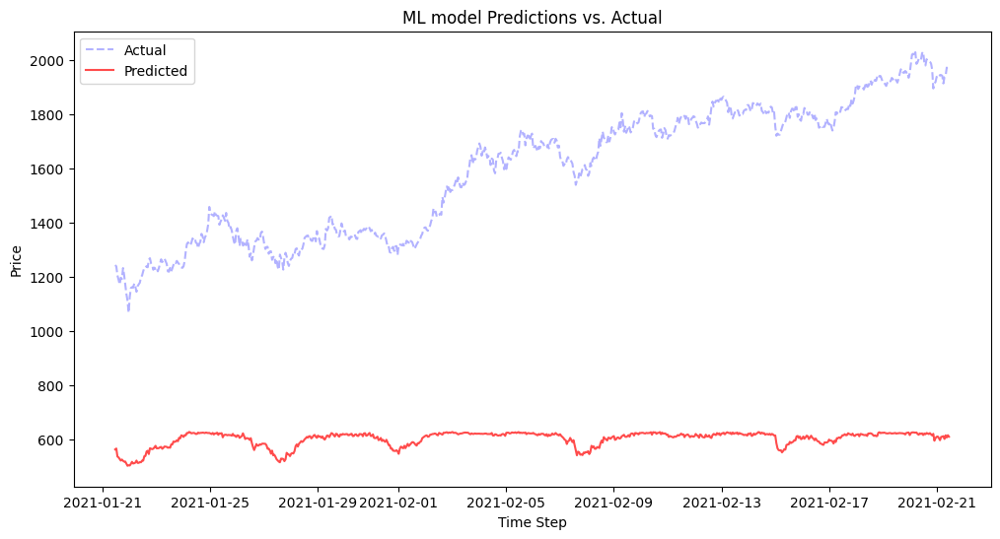

In [603]:
all_predictions = y_pred#['predicted_close']
all_targets = y_test#['close']
plot(all_predictions, all_targets, "ML model Predictions vs. Actual")

In [560]:
# Функция для расчета метрик RMSE, MAE, MAPE
def calculate_metrics(y_true, y_pred):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100  # MAPE в процентах
    # Создаем DataFrame с метриками
    metrics_table = pd.DataFrame({
        'RMSE': [rmse],
        'MAE': [mae],
        'MAPE (%)': [mape]
    }, index=['Test'])
    return metrics_table

In [563]:
print(calculate_metrics(all_targets.dropna(), all_predictions[:COMMON_CONFIG.ML_TARGET_NEXT_PERIOD_OFFSET]))

          RMSE        MAE  MAPE (%)
Test  41.23506  38.296701       NaN


In [524]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

def calculate_metrics_table_for_all_splits(train, val, test):
    # Функция для расчета метрик RMSE, MAE, MAPE
    def calculate_metrics(y_true, y_pred):
        rmse = np.sqrt(mean_squared_error(y_true, y_pred))
        mae = mean_absolute_error(y_true, y_pred)
        mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100  # MAPE в процентах
        return rmse, mae, mape
    
    # Рассчитываем метрики для каждой выборки
    train_rmse, train_mae, train_mape = calculate_metrics(*train)
    val_rmse, val_mae, val_mape = calculate_metrics(*val)
    test_rmse, test_mae, test_mape = calculate_metrics(*test)
    
    # Создаем DataFrame с метриками
    metrics_table = pd.DataFrame({
        'RMSE': [train_rmse, val_rmse, test_rmse],
        'MAE': [train_mae, val_mae, test_mae],
        'MAPE (%)': [train_mape, val_mape, test_mape]
    }, index=['Train', 'Validation', 'Test'])
    
    return metrics_table

In [529]:
y_train_pred = rfc_model.predict(X_train_selected)
y_val_pred = rfc_model.predict(X_val_selected)
y_test_pred = rfc_model.predict(X_test_selected)


calculate_metrics_table_for_all_splits(
    (y_train, y_train_pred),
    (y_val, y_val_pred),
    (y_test, y_test_pred))

ValueError: Input contains NaN.

#### Определим метрики качества моделей

In [518]:
def predict_and_get_metrics(_model, _X_train, _y_train, _X_val, _y_val,  _X_test, _y_test):
    _y_train_pred_prob = predict(_model, _X_train)
    _y_val_pred_prob = predict(_model, _X_val)
    _y_test_pred_prob = predict(_model, _X_test)
    display_metrics_set("обучающей", _y_train, _y_train_pred_prob)
    display_metrics_set("валидационной", _y_val, _y_val_pred_prob)
    display_metrics_set("тестовой", _y_test, _y_test_pred_prob)
    return _y_train_pred_prob, _y_val_pred_prob, _y_test_pred_prob

In [519]:
from sklearn.metrics import roc_auc_score, precision_score, recall_score, accuracy_score, f1_score

def calculate_metrics_table(y_true, y_pred_prob, thresholds=[0.5, 0.6, 0.7, 0.8]):
    metrics_table = []
    
    for threshold in thresholds:
        y_pred = (y_pred_prob >= threshold).astype(int)
        metrics = {
            'Cutoff': threshold,
            'Precision': precision_score(y_true, y_pred),
            'Recall': recall_score(y_true, y_pred),
            'Accuracy': accuracy_score(y_true, y_pred),
            'F1-Score': f1_score(y_true, y_pred)
        }
        metrics_table.append(metrics)
    
    # Преобразуем список словарей в DataFrame для удобного вывода
    return pd.DataFrame(metrics_table)*100

In [520]:
# Выводим ROC AUC и метрики для всех выборок
def display_metrics_set(name, y_true, y_pred_prob):
    roc_auc = roc_auc_score(y_true, y_pred_prob)
    print(f"\n=== Метрики для {name} выборки ===")
    print(f"ROC AUC: {roc_auc:.4f}")
    metrics_table = calculate_metrics_table(y_true, y_pred_prob)
    print(metrics_table)

In [521]:
def predict(_model, _x):
    # Предсказания на тренировочной, валидационной и тестовой выборках
    return _model.predict_proba(_x)[:, 1]

#### Создание модели классификации - будет цена расти или падать

В качестве Baseline модели возьмем модель Logistic Regression c StandardScaler ElasticNet

In [421]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

# 1. Применение StandardScaler к тренировочной, валидационной и тестовой выборкам
scaler = StandardScaler()

# Обучаем скейлер на тренировочной выборке и трансформируем её
X_train_scaled = scaler.fit_transform(X_train) #X_train.copy() #

# Трансформируем валидационную и тестовую выборки
X_val_scaled = scaler.transform(X_val) #X_val.copy() 
X_test_scaled = scaler.transform(X_test) #X_test.copy() 

In [422]:
# 2. Обучение модели логистической регрессии на тренировочной выборке
lr_model = LogisticRegression(solver='saga', penalty='elasticnet', l1_ratio=0.5,)  
lr_model.fit(X_train_scaled, y_train)

LogisticRegression(l1_ratio=0.5, penalty='elasticnet', solver='saga')

In [424]:
_, _, _ = predict_and_get_metrics(lr_model, X_train_scaled, y_train, X_val_scaled, y_val,  X_test_scaled, y_test)


=== Метрики для обучающей выборки ===
ROC AUC: 0.5463
   Cutoff  Precision     Recall   Accuracy   F1-Score
0    50.0  53.690444  63.457623  53.739237  58.166866
1    60.0  57.142857   1.170781  49.466284   2.294550
2    70.0  60.000000   0.038178  49.324390   0.076307
3    80.0  75.000000   0.019089  49.324390   0.038168

=== Метрики для валидационной выборки ===
ROC AUC: 0.5463
   Cutoff  Precision     Recall   Accuracy   F1-Score
0    50.0  53.690444  63.457623  53.739237  58.166866
1    60.0  57.142857   1.170781  49.466284   2.294550
2    70.0  60.000000   0.038178  49.324390   0.076307
3    80.0  75.000000   0.019089  49.324390   0.038168

=== Метрики для тестовой выборки ===
ROC AUC: 0.5572
   Cutoff   Precision     Recall   Accuracy   F1-Score
0    50.0   54.618987  57.624074  54.251565  56.081303
1    60.0   47.058824   0.359308  49.288560   0.713171
2    70.0  100.000000   0.044914  49.334092   0.089787
3    80.0    0.000000   0.000000  49.311326   0.000000


#### Попробуем более продвинутые модели

In [425]:
from sklearn.ensemble import RandomForestClassifier

# Обучение модели случайного леса на тренировочной выборке
rfc_model = RandomForestClassifier(
    #n_estimators=100,            # Количество деревьев в лесу. Большее количество деревьев может улучшить точность, но увеличивает время обучения.
    #max_depth=5,                 # Максимальная глубина каждого дерева. Ограничение глубины снижает вероятность переобучения.
    #min_samples_split=200,        # Минимальное число образцов для разделения узла. Большее значение предотвращает разделение узлов с малым числом выборок.
    #min_samples_leaf=2,          # Минимальное количество выборок, которое должно находиться в каждом листе. Увеличение значения делает модель более устойчивой.
    #max_features='sqrt',         # Максимальное количество признаков, используемых при поиске лучшего разбиения. "sqrt" берёт корень из общего числа признаков.
    #max_leaf_nodes=20,           # Максимальное число листьев в каждом дереве. Ограничивает количество конечных узлов, упрощая структуру дерева.
    #min_impurity_decrease=0.01,  # Минимальное уменьшение нечистоты, требуемое для разделения. Предотвращает создание слишком мелких узлов.
    #bootstrap=False,              # Использовать бутстрэп (выборка с возвращением) для создания деревьев. Это повышает устойчивость модели.
    random_state=COMMON_CONFIG.SEED              # Устанавливает начальное значение для генератора случайных чисел, что обеспечивает воспроизводимость результатов.
)
rfc_model.fit(X_train_scaled, y_train)

RandomForestClassifier(random_state=777)

In [426]:
rfc_y_train_pred_prob, rfc_y_val_pred_prob, rfc_y_test_pred_prob = predict_and_get_metrics(rfc_model, X_train_scaled, y_train, X_val_scaled, y_val,  X_test_scaled, y_test)


=== Метрики для обучающей выборки ===
ROC AUC: 1.0000
   Cutoff  Precision      Recall    Accuracy    F1-Score
0    50.0      100.0  100.000000  100.000000  100.000000
1    60.0      100.0   99.987274   99.993550   99.993637
2    70.0      100.0   98.428353   99.203457   99.207953
3    80.0      100.0   68.917027   84.246509   81.598674

=== Метрики для валидационной выборки ===
ROC AUC: 1.0000
   Cutoff  Precision      Recall    Accuracy    F1-Score
0    50.0      100.0  100.000000  100.000000  100.000000
1    60.0      100.0   99.987274   99.993550   99.993637
2    70.0      100.0   98.428353   99.203457   99.207953
3    80.0      100.0   68.917027   84.246509   81.598674

=== Метрики для тестовой выборки ===
ROC AUC: 0.5278
   Cutoff  Precision     Recall   Accuracy   F1-Score
0    50.0  52.558543  54.435212  51.997723  53.480419
1    60.0  53.333333  21.738154  50.688674  30.887045
2    70.0  49.279539   3.840108  49.254411   7.125000
3    80.0  50.000000   0.291938  49.311326   0

In [1113]:
# from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
# 
# rfc_model = RandomForestClassifier(random_state=COMMON_CONFIG.SEED)
# 
# # Определяем сетку гиперпараметров
# param_distributions = {
#         'bootstrap': [True, False],
#         'max_depth': [5, 10, 50, 100, 200, None],
#         'max_features': ['auto', 'sqrt'],
#         #'min_samples_leaf': [2, 10, 20, 50],
#         'max_leaf_nodes': [5, 25, 50, 100],
#         #'min_samples_split': [2, 10, 50, 200],
#         'n_estimators': [10, 50, 100]
# }

In [1114]:
# random_search = RandomizedSearchCV(
#     estimator=rfc_model,
#     param_distributions=param_distributions,
#     n_iter=10,                   # Число случайных комбинаций гиперпараметров для обучения
#     scoring='roc_auc',           # Оценочная метрика для выбора наилучшей модели
#     cv=3,                        # Количество фолдов для кросс-валидации
#     random_state=COMMON_CONFIG.SEED,
#     n_jobs=-1                    # Параллельное выполнение
# )
# 
# random_search.fit(X_train_scaled, y_train)
# 
# # Получаем лучшую модель и параметры
# best_rfc_model = random_search.best_estimator_
# best_params = random_search.best_params_
# best_score = random_search.best_score_
# 
# print("Лучшие параметры:", best_params)
# print("Лучший ROC AUC Score:", best_score)

Лучшие параметры: {'n_estimators': 50, 'max_leaf_nodes': 5, 'max_features': 'sqrt', 'max_depth': 50, 'bootstrap': True}
Лучший ROC AUC Score: 0.441446193278799


In [1082]:
# Инициализация GridSearchCV
# grid_search = GridSearchCV(
#     estimator=rfc_model,
#     param_grid=param_distributions,
#     scoring='roc_auc',           # Оценочная метрика для выбора наилучшей модели
#     cv=3,                        # Количество фолдов для кросс-валидации
#     n_jobs=-1                    # Параллельное выполнение
# )
# 
# # Обучение модели на тренировочных данных с использованием Grid Search
# grid_search.fit(X_train_scaled, y_train)
# 
# # Получаем лучшую модель и параметры
# best_rfc_model = grid_search.best_estimator_
# best_params = grid_search.best_params_
# best_score = grid_search.best_score_
# 
# print("Лучшие параметры:", best_params)
# print("Лучший ROC AUC Score:", best_score)

Лучшие параметры: {'bootstrap': False, 'max_depth': 5, 'max_features': 'sqrt', 'max_leaf_nodes': 5, 'n_estimators': 10}
Лучший ROC AUC Score: 0.498985767288653


In [1150]:
rfc_y_train_pred_prob, rfc_y_val_pred_prob, rfc_y_test_pred_prob = predict_and_get_metrics(rfc_model, X_train_scaled, y_train, X_val_scaled, y_val,  X_test_scaled, y_test)


=== Метрики для обучающей выборки ===
ROC AUC: 1.0000
    Cutoff  Precision    Recall  Accuracy  F1-Score
0 50.00000  100.00000 100.00000 100.00000 100.00000
1 60.00000  100.00000  99.95094  99.97419  99.97546
2 70.00000  100.00000  99.07676  99.51439  99.53624
3 80.00000  100.00000  93.22956  96.43888  96.49617

=== Метрики для валидационной выборки ===
ROC AUC: 1.0000
    Cutoff  Precision    Recall  Accuracy  F1-Score
0 50.00000  100.00000 100.00000 100.00000 100.00000
1 60.00000  100.00000  99.95094  99.97419  99.97546
2 70.00000  100.00000  99.07676  99.51439  99.53624
3 80.00000  100.00000  93.22956  96.43888  96.49617

=== Метрики для тестовой выборки ===
ROC AUC: 0.5729
    Cutoff  Precision   Recall  Accuracy  F1-Score
0 50.00000   54.91803 53.88740  54.76510  54.39783
1 60.00000   59.54198 41.82306  56.64430  49.13386
2 70.00000   55.33333 22.25201  52.08054  31.73996
3 80.00000   58.33333  9.38338  51.27517  16.16628


In [427]:
!pip install catboost==1.0.6 -q
import catboost as cb

In [458]:
cb_model = cb.CatBoostClassifier(
    n_estimators=1000,             # Общее количество деревьев (итераций). Меньшее значение снижает вероятность переобучения.
    random_state=COMMON_CONFIG.SEED,               # Устанавливает начальное значение для генератора случайных чисел, что обеспечивает воспроизводимость результатов.
    #learning_rate=0.1,             # Темп обучения. Более низкое значение помогает улучшить стабильность и уменьшить вероятность переобучения.
    #depth=6,                       # Глубина каждого дерева. Меньшая глубина снижает вероятность переобучения.
    #l2_leaf_reg=3.0,               # Коэффициент L2-регуляризации на веса в листьях. Увеличивает штраф за большие веса и снижает переобучение.
    #bagging_temperature=1.0,       # Параметр, контролирующий интенсивность случайности в выборке для каждого дерева. Чем выше значение, тем больше разнообразие деревьев.
    #rsm=0.8,                       # Доля признаков, используемых при обучении каждого дерева. Значение меньше 1 уменьшает переобучение.
    #subsample=0.8,                 # Доля данных, используемых для каждого дерева. Чем меньше значение, тем сильнее регуляризация и выше разнообразие деревьев.
    #verbose=0                      # Отключает вывод в консоль.
)

# Добавляем валидационную выборку как eval_set и используем early_stopping
cb_model.fit(X_train_scaled, y_train, eval_set=(X_val_scaled, y_val), early_stopping_rounds=50)

Learning rate set to 0.074013
0:	learn: 0.6924949	test: 0.6924986	best: 0.6924986 (0)	total: 8.77ms	remaining: 8.76s
1:	learn: 0.6918827	test: 0.6918855	best: 0.6918855 (1)	total: 15.2ms	remaining: 7.58s
2:	learn: 0.6914134	test: 0.6914179	best: 0.6914179 (2)	total: 20.9ms	remaining: 6.96s
3:	learn: 0.6909795	test: 0.6909867	best: 0.6909867 (3)	total: 25.9ms	remaining: 6.45s
4:	learn: 0.6904120	test: 0.6904221	best: 0.6904221 (4)	total: 32.4ms	remaining: 6.45s
5:	learn: 0.6899495	test: 0.6899628	best: 0.6899628 (5)	total: 38.2ms	remaining: 6.33s
6:	learn: 0.6895549	test: 0.6895713	best: 0.6895713 (6)	total: 44.1ms	remaining: 6.26s
7:	learn: 0.6890968	test: 0.6891160	best: 0.6891160 (7)	total: 50.3ms	remaining: 6.23s
8:	learn: 0.6887954	test: 0.6888172	best: 0.6888172 (8)	total: 56.5ms	remaining: 6.22s
9:	learn: 0.6884956	test: 0.6885203	best: 0.6885203 (9)	total: 63.1ms	remaining: 6.25s
10:	learn: 0.6882524	test: 0.6882795	best: 0.6882795 (10)	total: 68.4ms	remaining: 6.15s
11:	learn: 

In [459]:
cb_y_train_pred_prob, cb_y_val_pred_prob, cb_y_test_pred_prob = predict_and_get_metrics(cb_model, X_train_scaled, y_train, X_val_scaled, y_val,  X_test_scaled, y_test)


=== Метрики для обучающей выборки ===
ROC AUC: 0.8225
   Cutoff   Precision     Recall   Accuracy   F1-Score
0    50.0   72.980965  75.381777  73.378697  74.161946
1    60.0   92.118137  32.349198  64.310362  47.883212
2    70.0   99.441341   9.060830  53.884356  16.608351
3    80.0  100.000000   2.042504  50.353123   4.003243

=== Метрики для валидационной выборки ===
ROC AUC: 0.8225
   Cutoff   Precision     Recall   Accuracy   F1-Score
0    50.0   72.980965  75.381777  73.378697  74.161946
1    60.0   92.118137  32.349198  64.310362  47.883212
2    70.0   99.441341   9.060830  53.884356  16.608351
3    80.0  100.000000   2.042504  50.353123   4.003243

=== Метрики для тестовой выборки ===
ROC AUC: 0.5468
   Cutoff  Precision     Recall   Accuracy   F1-Score
0    50.0  54.477069  50.415450  53.511668  52.367623
1    60.0  55.435847  12.710532  50.574843  20.679576
2    70.0  57.731959   2.515158  49.652817   4.820314
3    80.0  54.285714   0.426679  49.345475   0.846702


Попробуем сделать оптимизацию с использованием Optuna

In [1119]:
!pip install optuna -q
import optuna

In [1157]:
# Функция цели для оптимизации гиперпараметров CatBoost с учетом переобучения
def objective(trial):
    # Определяем гиперпараметры для поиска
    params = {
        'iterations': trial.suggest_int('iterations', 100, 1000),
        'depth': trial.suggest_int('depth', 3, 10),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
        'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10),
        'bagging_temperature': trial.suggest_uniform('bagging_temperature', 0, 1),
        'rsm': trial.suggest_uniform('rsm', 0.5, 1.0),
        'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
        'random_seed': COMMON_CONFIG.SEED,
        'verbose': 0,
        'early_stopping_rounds': 50
    }
    
    # Инициализация модели с заданными параметрами
    cb_model = cb.CatBoostClassifier(**params)

    # Обучение модели с валидационной выборкой
    cb_model.fit(X_train_scaled, y_train, eval_set=(X_val_scaled, y_val), early_stopping_rounds=50, verbose=0)
    
    # Предсказания на тренировочной и валидационной выборках
    y_train_pred = cb_model.predict_proba(X_train_scaled)[:, 1]
    y_val_pred = cb_model.predict_proba(X_val)[:, 1]
    
    # Оценка метрики ROC AUC на тренировочной и валидационной выборках
    train_auc = roc_auc_score(y_train, y_train_pred)
    val_auc = roc_auc_score(y_val, y_val_pred)
    
    # Штраф за переобучение (разница между тренировочной и валидационной метриками)
    overfitting_penalty = abs(train_auc - val_auc)
    
    # Целевая функция с учетом штрафа: при переобучении функция уменьшится
    score = val_auc - overfitting_penalty
    
    return score

In [1158]:
# Создаем объект исследования
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=3, n_jobs=-1)  

# Получаем лучшие параметры и результат
best_cb_model_params = study.best_params
best_score = study.best_value

print("Лучшие параметры:", best_cb_model_params)
print("Лучший ROC AUC Score:", best_score)

[I 2025-01-19 20:37:32,572] A new study created in memory with name: no-name-a7cb7c96-ffa7-4e8a-903d-820c3fb5ea21
[I 2025-01-19 20:38:47,669] Trial 1 finished with value: 0.12987853713856679 and parameters: {'iterations': 817, 'depth': 7, 'learning_rate': 0.034658776653689986, 'l2_leaf_reg': 1.9384941500672848, 'bagging_temperature': 0.7631739094187933, 'rsm': 0.6580687857756541, 'subsample': 0.6602486637389826}. Best is trial 1 with value: 0.12987853713856679.
[I 2025-01-19 20:38:53,029] Trial 0 finished with value: 0.04042985058191262 and parameters: {'iterations': 408, 'depth': 9, 'learning_rate': 0.1155409599806341, 'l2_leaf_reg': 0.8806050828329138, 'bagging_temperature': 0.7753040275091309, 'rsm': 0.7423363614924354, 'subsample': 0.7089864182593312}. Best is trial 1 with value: 0.12987853713856679.
[I 2025-01-19 20:38:57,368] Trial 2 finished with value: 0.0658000216961585 and parameters: {'iterations': 952, 'depth': 7, 'learning_rate': 0.05816741303875177, 'l2_leaf_reg': 0.24544

Лучшие параметры: {'iterations': 817, 'depth': 7, 'learning_rate': 0.034658776653689986, 'l2_leaf_reg': 1.9384941500672848, 'bagging_temperature': 0.7631739094187933, 'rsm': 0.6580687857756541, 'subsample': 0.6602486637389826}
Лучший ROC AUC Score: 0.12987853713856679


In [1159]:
# Инициализация модели CatBoostClassifier с оптимальными гиперпараметрами
optimal_params = study.best_params
cb_model = cb.CatBoostClassifier(
    **optimal_params,
    random_seed=COMMON_CONFIG.SEED,
    verbose=0
)

# Обучение модели на тренировочной выборке с валидационной проверкой для контроля
cb_model.fit(X_train_scaled, y_train, eval_set=(X_val_scaled, y_val), early_stopping_rounds=50, verbose=0)

In [1160]:
cb_y_train_pred_prob, cb_y_val_pred_prob, cb_y_test_pred_prob = predict_and_get_metrics(cb_model, X_train_scaled, y_train, X_val_scaled, y_val,  X_test_scaled, y_test)


=== Метрики для обучающей выборки ===
ROC AUC: 0.9091
    Cutoff  Precision   Recall  Accuracy  F1-Score
0 50.00000   80.27356 87.42697  82.08647  83.69769
1 60.00000   93.67106 59.21235  76.44216  72.55834
2 70.00000   98.59958 27.00593  61.40474  42.39899
3 80.00000   99.94527  8.14415  51.68321  15.06104

=== Метрики для валидационной выборки ===
ROC AUC: 0.9091
    Cutoff  Precision   Recall  Accuracy  F1-Score
0 50.00000   80.27356 87.42697  82.08647  83.69769
1 60.00000   93.67106 59.21235  76.44216  72.55834
2 70.00000   98.59958 27.00593  61.40474  42.39899
3 80.00000   99.94527  8.14415  51.68321  15.06104

=== Метрики для тестовой выборки ===
ROC AUC: 0.5962
    Cutoff  Precision   Recall  Accuracy  F1-Score
0 50.00000   56.57895 57.64075  56.64430  57.10491
1 60.00000   61.73913 38.06971  57.18121  47.09784
2 70.00000   66.66667 17.15818  54.22819  27.29211
3 80.00000   14.28571  0.26810  49.26174   0.52632


#### Попробуем методы ансамблирования

In [1162]:
# Создание новых признаков для стекинга (объединяем предсказания обеих моделей)
# Тренировочные данные для логистической регрессии
stacked_X_train = np.column_stack((rfc_y_train_pred_prob, cb_y_train_pred_prob))
stacked_X_val = np.column_stack((rfc_y_val_pred_prob, cb_y_val_pred_prob))
stacked_X_test = np.column_stack((rfc_y_test_pred_prob, cb_y_test_pred_prob))

In [1163]:
stacking_model = LogisticRegression(random_state=COMMON_CONFIG.SEED)
stacking_model.fit(stacked_X_train, y_train)

LogisticRegression(random_state=777)

In [1164]:
st_y_train_pred_prob, st_y_val_pred_prob, st_y_test_pred_prob = predict_and_get_metrics(stacking_model, stacked_X_train, y_train, stacked_X_val, y_val,  stacked_X_test, y_test)


=== Метрики для обучающей выборки ===
ROC AUC: 1.0000
    Cutoff  Precision    Recall  Accuracy  F1-Score
0 50.00000  100.00000 100.00000 100.00000 100.00000
1 60.00000  100.00000 100.00000 100.00000 100.00000
2 70.00000  100.00000  99.99554  99.99765  99.99777
3 80.00000  100.00000  99.98216  99.99062  99.99108

=== Метрики для валидационной выборки ===
ROC AUC: 1.0000
    Cutoff  Precision    Recall  Accuracy  F1-Score
0 50.00000  100.00000 100.00000 100.00000 100.00000
1 60.00000  100.00000 100.00000 100.00000 100.00000
2 70.00000  100.00000  99.99554  99.99765  99.99777
3 80.00000  100.00000  99.98216  99.99062  99.99108

=== Метрики для тестовой выборки ===
ROC AUC: 0.5720
    Cutoff  Precision   Recall  Accuracy  F1-Score
0 50.00000   55.46218 53.08311  55.16779  54.24658
1 60.00000   57.18654 50.13405  56.24161  53.42857
2 70.00000   58.03279 47.45308  56.51007  52.21239
3 80.00000   59.92908 45.30831  57.44966  51.60305


In [1165]:
from sklearn.ensemble import VotingClassifier

voting_clf = VotingClassifier(estimators=[
    ('lr', lr_model),
    ('rfc', rfc_model),
    ('cb', cb_model)], voting='soft')

In [1166]:
voting_clf.fit(X_train_scaled, y_train)

VotingClassifier(estimators=[('lr',
                              LogisticRegression(l1_ratio=0.5,
                                                 penalty='elasticnet',
                                                 solver='saga')),
                             ('rfc', RandomForestClassifier(random_state=777)),
                             ('cb',
                              <catboost.core.CatBoostClassifier object at 0x1b26033d0>)],
                 voting='soft')

In [1167]:
vc_y_train_pred_prob, vc_y_val_pred_prob, vc_y_test_pred_prob = predict_and_get_metrics(voting_clf, X_train_scaled, y_train, X_val_scaled, y_val,  X_test_scaled, y_test)


=== Метрики для обучающей выборки ===
ROC AUC: 1.0000
    Cutoff  Precision   Recall  Accuracy  F1-Score
0 50.00000   99.41814 99.83052  99.60354  99.62390
1 60.00000  100.00000 93.88966  96.78607  96.84855
2 70.00000  100.00000 43.71794  70.39670  60.83853
3 80.00000  100.00000  2.15869  48.53731   4.22615

=== Метрики для валидационной выборки ===
ROC AUC: 1.0000
    Cutoff  Precision   Recall  Accuracy  F1-Score
0 50.00000   99.41814 99.83052  99.60354  99.62390
1 60.00000  100.00000 93.88966  96.78607  96.84855
2 70.00000  100.00000 43.71794  70.39670  60.83853
3 80.00000  100.00000  2.15869  48.53731   4.22615

=== Метрики для тестовой выборки ===
ROC AUC: 0.5921
    Cutoff  Precision   Recall  Accuracy  F1-Score
0 50.00000   55.28455 54.69169  55.16779  54.98652
1 60.00000   66.49485 34.58445  58.52349  45.50265
2 70.00000   42.85714  1.60858  49.66443   3.10078
3 80.00000    0.00000  0.00000  49.93289   0.00000


In [1168]:
vc_predictions_df = pd.DataFrame(voting_clf.predict(X_test_scaled), columns = ["MlSignal"])

### Применим ансамбль в стратегии

In [1169]:
class TechAnalysisWithMLFilterStrategy(Strategy):
    def init(self):
        self.signal = self.I(lambda: self.data.Signal)
        self.ml_signal = self.I(lambda: self.data.MlSignal)
        self.previous_signal = 0

    def next(self):
        current_signal = self.signal[-1]
        current_ml_signal = self.ml_signal[-1]

        if current_signal != self.previous_signal:
            if current_signal == 1 and current_ml_signal == 1:
                if self.position.is_short:
                    self.position.close()

                if not self.position.is_long:
                    self.buy()

            elif current_signal == -1 and current_ml_signal == 0:
                if self.position.is_long:
                    self.position.close()

                if not self.position.is_short:
                    self.sell()

            elif current_signal == 0:
                if self.position:
                    self.position.close()

        self.previous_signal = current_signal

In [1202]:
bt_best_params_with_ml_test_data = pd.concat([bt_best_params_test_data.reset_index(), vc_predictions_df], axis=1)
_ = run_backtest(bt_best_params_with_ml_test_data, TechAnalysisWithMLFilterStrategy)

Start                                 0.00000
End                                 744.00000
Duration                            744.00000
Exposure Time [%]                    22.28188
Equity Final [$]                1063750.56460
Equity Peak [$]                 1151987.33568
Return [%]                            6.37506
Buy & Hold Return [%]               -13.80628
Return (Ann.) [%]                     0.00000
Volatility (Ann.) [%]                     NaN
Sharpe Ratio                              NaN
Sortino Ratio                             NaN
Calmar Ratio                          0.00000
Max. Drawdown [%]                    -7.65953
Avg. Drawdown [%]                    -1.80244
Max. Drawdown Duration              115.00000
Avg. Drawdown Duration               23.00000
# Trades                              3.00000
Win Rate [%]                         66.66667
Best Trade [%]                        7.10528
Worst Trade [%]                      -0.99928
Avg. Trade [%]                    

### 5. Нейронные сети

In [907]:
class TSMIXER_CFG:
    WINDOW = 10
    BATCH_SIZE = 32
    LR = 1e-3
    SEED = 777

In [908]:
df = get_data_from_api(COMMON_CONFIG.SYMBOL, COMMON_CONFIG.TIMEFRAME, COMMON_CONFIG.START_DATE)
save_data_to_file(df, COMMON_CONFIG.SYMBOL, COMMON_CONFIG.TIMEFRAME)
df

Fetched 500 ETH/USDT 1h candles from 2020-01-01T00:00:00.000Z
Sleep for 0.05
Fetched 500 ETH/USDT 1h candles from 2020-01-21T20:00:00.000Z
Sleep for 0.05
Fetched 500 ETH/USDT 1h candles from 2020-02-11T17:00:00.000Z
Sleep for 0.05
Fetched 500 ETH/USDT 1h candles from 2020-03-03T18:00:00.000Z
Sleep for 0.05
Fetched 500 ETH/USDT 1h candles from 2020-03-24T15:00:00.000Z
Sleep for 0.05
Fetched 500 ETH/USDT 1h candles from 2020-04-14T11:00:00.000Z
Sleep for 0.05
Fetched 500 ETH/USDT 1h candles from 2020-05-05T09:00:00.000Z
Sleep for 0.05
Fetched 500 ETH/USDT 1h candles from 2020-05-26T05:00:00.000Z
Sleep for 0.05
Fetched 500 ETH/USDT 1h candles from 2020-06-16T01:00:00.000Z
Sleep for 0.05
Fetched 500 ETH/USDT 1h candles from 2020-07-07T00:00:00.000Z
Sleep for 0.05
Fetched 500 ETH/USDT 1h candles from 2020-07-27T20:00:00.000Z
Sleep for 0.05
Fetched 500 ETH/USDT 1h candles from 2020-08-17T16:00:00.000Z
Sleep for 0.05
Fetched 500 ETH/USDT 1h candles from 2020-09-07T12:00:00.000Z
Sleep for 0.05

,date,open,high,low,close,volume
0,1577836800000,129.16000,129.19000,128.68000,128.87000,7769.17336
1,1577840400000,128.87000,130.65000,128.78000,130.64000,11344.65516
2,1577844000000,130.63000,130.98000,130.35000,130.85000,7603.35623
3,1577847600000,130.85000,130.89000,129.94000,130.20000,4968.55433
4,1577851200000,130.21000,130.74000,130.15000,130.20000,3397.90747
...,...,...,...,...,...,...
44256,1737273600000,3276.06000,3277.53000,3215.81000,3221.90000,47929.54510
44257,1737277200000,3221.90000,3233.77000,3143.02000,3226.00000,105144.51170
44258,1737280800000,3226.01000,3226.89000,3172.97000,3174.70000,51453.00680
44259,1737284400000,3174.70000,3188.90000,3130.48000,3149.97000,50955.62760


In [909]:
df = read_data_from_file(COMMON_CONFIG.SYMBOL, COMMON_CONFIG.TIMEFRAME)
df

,open,high,low,close,volume
date,,,,,
2020-01-01 00:00:00,129.16000,129.19000,128.68000,128.87000,7769.17336
2020-01-01 01:00:00,128.87000,130.65000,128.78000,130.64000,11344.65516
2020-01-01 02:00:00,130.63000,130.98000,130.35000,130.85000,7603.35623
2020-01-01 03:00:00,130.85000,130.89000,129.94000,130.20000,4968.55433
2020-01-01 04:00:00,130.21000,130.74000,130.15000,130.20000,3397.90747
...,...,...,...,...,...
2025-01-19 08:00:00,3276.06000,3277.53000,3215.81000,3221.90000,47929.54510
2025-01-19 09:00:00,3221.90000,3233.77000,3143.02000,3226.00000,105144.51170
2025-01-19 10:00:00,3226.01000,3226.89000,3172.97000,3174.70000,51453.00680


In [910]:
#Удаляем последнюю строку, так как в данных для ML обучения из-за сдвига будет расхождение в датах
df_for_bt = df.copy()[:COMMON_CONFIG.ML_TARGET_NEXT_PERIOD_OFFSET]
df_for_bt

,open,high,low,close,volume
date,,,,,
2020-01-01 00:00:00,129.16000,129.19000,128.68000,128.87000,7769.17336
2020-01-01 01:00:00,128.87000,130.65000,128.78000,130.64000,11344.65516
2020-01-01 02:00:00,130.63000,130.98000,130.35000,130.85000,7603.35623
2020-01-01 03:00:00,130.85000,130.89000,129.94000,130.20000,4968.55433
2020-01-01 04:00:00,130.21000,130.74000,130.15000,130.20000,3397.90747
...,...,...,...,...,...
2025-01-19 07:00:00,3283.44000,3293.29000,3263.00000,3276.06000,25129.63590
2025-01-19 08:00:00,3276.06000,3277.53000,3215.81000,3221.90000,47929.54510
2025-01-19 09:00:00,3221.90000,3233.77000,3143.02000,3226.00000,105144.51170


In [911]:
ta_data, _ = enrich_with_ta(df_for_bt.reset_index(), best_ta_params)
data_with_signals = get_trade_signals(ta_data)
bt_data = convert_data_to_bt_format(data_with_signals)
bt_best_params_train_data, bt_best_params_test_data = train_test_split(bt_data)

Train size: 43513, Test size: 745


In [912]:
bt_best_params_test_data

,Open,High,Low,Close,Volume,Signal
Datetime,,,,,,
2024-12-19 11:00:00,3707.60000,3712.99000,3697.09000,3705.62000,11556.95390,0
2024-12-19 12:00:00,3705.62000,3710.20000,3674.40000,3679.73000,15833.57750,0
2024-12-19 13:00:00,3679.73000,3699.31000,3673.48000,3678.39000,23140.95210,0
2024-12-19 14:00:00,3678.39000,3702.51000,3634.34000,3638.59000,37906.70450,0
2024-12-19 15:00:00,3638.59000,3640.94000,3572.73000,3613.92000,61338.98430,-1
...,...,...,...,...,...,...
2025-01-19 07:00:00,3283.44000,3293.29000,3263.00000,3276.06000,25129.63590,-1
2025-01-19 08:00:00,3276.06000,3277.53000,3215.81000,3221.90000,47929.54510,-1
2025-01-19 09:00:00,3221.90000,3233.77000,3143.02000,3226.00000,105144.51170,-1


In [913]:
data = df.copy().reset_index()
data = convert_data_to_bt_format(data)
data

,Open,High,Low,Close,Volume
Datetime,,,,,
2020-01-01 00:00:00,129.16000,129.19000,128.68000,128.87000,7769.17336
2020-01-01 01:00:00,128.87000,130.65000,128.78000,130.64000,11344.65516
2020-01-01 02:00:00,130.63000,130.98000,130.35000,130.85000,7603.35623
2020-01-01 03:00:00,130.85000,130.89000,129.94000,130.20000,4968.55433
2020-01-01 04:00:00,130.21000,130.74000,130.15000,130.20000,3397.90747
...,...,...,...,...,...
2025-01-19 08:00:00,3276.06000,3277.53000,3215.81000,3221.90000,47929.54510
2025-01-19 09:00:00,3221.90000,3233.77000,3143.02000,3226.00000,105144.51170
2025-01-19 10:00:00,3226.01000,3226.89000,3172.97000,3174.70000,51453.00680


In [914]:
# Определяем дату начала валидационной выборки
val_start_date = data.index.max() - pd.DateOffset(months=int(COMMON_CONFIG.VAL_DATA_OFFSET[0])) - pd.DateOffset(hours=int(TSMIXER_CFG.WINDOW))

# Определяем дату начала тестовой выборки
test_start_date = data.index.max() - pd.DateOffset(months=int(COMMON_CONFIG.TEST_DATA_OFFSET[0])) - pd.DateOffset(hours=int(TSMIXER_CFG.WINDOW))
print(f'val_start_date {val_start_date}')
print(f'test_start_date {test_start_date}')

val_start_date 2024-11-19 02:00:00
test_start_date 2024-12-19 02:00:00


In [915]:
from sklearn.preprocessing import StandardScaler

!pip install tensorflow -q

import tensorflow as tf
from tensorflow.keras import layers

class DataLoader:
    def __init__(self, batch_size, seq_len, pred_len, data):
        self.batch_size = batch_size
        self.seq_len = seq_len
        self.pred_len = pred_len
        self.target_slice = slice(0, None)

        self._read_data(data)

    def _read_data(self, df):
        train_df = df[df.index < val_start_date]
        val_df = df[(df.index >= val_start_date) & (df.index < test_start_date)]
        test_df = df[df.index >= test_start_date]

        #self.scaler = StandardScaler()
        #self.scaler.fit(train_df.values)

        def scale_df(df, scaler):
            data = scaler.transform(df.values)
            return pd.DataFrame(data, index=df.index, columns=df.columns)

        self.train_df = train_df#scale_df(train_df, self.scaler)
        #print(f'train_df shape', self.train_df.shape)
        
        self.val_df = val_df#scale_df(val_df, self.scaler)
        #print(f'val_df shape', self.val_df.shape)
        
        self.test_df = test_df#scale_df(test_df, self.scaler)
        #print(f'test_df start', self.test_df.head(1).index)
        #print(f'test_df end', self.test_df.tail(1).index)
        #print(f'test_df shape', self.test_df.shape)
        
        self.n_feature = self.train_df.shape[-1]
        #print(f'n_feature', self.n_feature)

    def _split_window(self, data):
        inputs = data[:, : self.seq_len, :]
        labels = data[:, self.seq_len :, self.target_slice]
        #print(f'inputs', inputs)
        #print(f'labels', labels)

        inputs.set_shape([None, self.seq_len, None])
        #print(f'inputs shape', inputs.shape)
        
        labels.set_shape([None, self.pred_len, None])
        #print(f'labels shape', labels.shape)
        return inputs, labels

    def _make_dataset(self, data, shuffle=True):
        data = np.array(data, dtype=np.float32)
        ds = tf.keras.utils.timeseries_dataset_from_array(
            data=data,
            targets=None,
            sequence_length=(self.seq_len + self.pred_len),
            sequence_stride=1,
            shuffle=shuffle,
            batch_size=self.batch_size,
        )
        ds = ds.map(self._split_window)
        return ds

    def inverse_transform(self, data):
        return self.scaler.inverse_transform(data)

    def get_train(self, shuffle: bool=True):
        return self._make_dataset(self.train_df, shuffle=shuffle)

    def get_val(self):
        return self._make_dataset(self.val_df, shuffle=False)

    def get_test(self):
        return self._make_dataset(self.test_df, shuffle=False)
    
data_loader = DataLoader(
    batch_size=TSMIXER_CFG.BATCH_SIZE,
    seq_len=TSMIXER_CFG.WINDOW,
    pred_len=1,
    data=data[["Close"]]
    )

tf_train_data = data_loader.get_train()
tf_val_data = data_loader.get_val()
tf_test_data = data_loader.get_test()

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sqlalchemy 2.0.37 requires typing-extensions>=4.6.0, but you have typing-extensions 4.5.0 which is incompatible.
torch 2.2.2 requires typing-extensions>=4.8.0, but you have typing-extensions 4.5.0 which is incompatible.


In [916]:
from typing import List

class TransposeLayer(layers.Layer):
    def __init__(self, perm: List[int], **kwargs) -> None:
        super().__init__(**kwargs)
        self.perm = perm

    def call(self, inputs):
        return tf.transpose(inputs, perm=self.perm)

In [917]:
def res_block(inputs, ff_dim: int):
    norm = layers.LayerNormalization

    # Time mixing
    x = norm(axis=[-2, -1])(inputs)
    x = TransposeLayer(perm=[0, 2, 1])(x)  # [Batch, Channel, Input Length]
    x = layers.Dense(x.shape[-1], activation='relu')(x)
    x = TransposeLayer(perm=[0, 2, 1])(x)  # [Batch, Input Length, Channel]
    x = layers.Dropout(0.7)(x)
    res = x + inputs

    # Feature mixing
    x = norm(axis=[-2, -1])(res)
    x = layers.Dense(ff_dim, activation='relu')(x)  # [Batch, Input Length, FF_Dim]
    x = layers.Dropout(0.7)(x)
    x = layers.Dense(inputs.shape[-1])(x)  # [Batch, Input Length, Channel]
    x = layers.Dropout(0.7)(x)
    return x + res

In [918]:
from typing import Tuple

def build_model(
    input_shape: Tuple[int],
    pred_len: int,
    n_block: int,
    ff_dim: int,
    target_slice,
):
    inputs = tf.keras.Input(shape=input_shape)
    x = inputs  # [Batch, Input Length, Channel]
    for _ in range(n_block):
        x = res_block(x, ff_dim)

    if target_slice:
        x = x[:, :, target_slice]

    # Temporal projection
    x = TransposeLayer(perm=[0, 2, 1])(x)  # [Batch, Channel, Input Length]
    x = layers.Dense(pred_len)(x)  # [Batch, Channel, Output Length]
    outputs = TransposeLayer(perm=[0, 2, 1])(x)  # [Batch, Output Length, Channel])
    return tf.keras.Model(inputs, outputs)

In [919]:
model = build_model(
    input_shape=(TSMIXER_CFG.WINDOW, data_loader.n_feature),
    pred_len=1,
    n_block=8,
    ff_dim=TSMIXER_CFG.WINDOW,
    target_slice=data_loader.target_slice
)

In [920]:
model.summary()

Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_9 (InputLayer)        [(None, 10, 1)]              0         []                            
                                                                                                  
 layer_normalization_128 (L  (None, 10, 1)                20        ['input_9[0][0]']             
 ayerNormalization)                                                                               
                                                                                                  
 transpose_layer_144 (Trans  (None, 1, 10)                0         ['layer_normalization_128[0][0
 poseLayer)                                                         ]']                           
                                                                                            

In [921]:
tf.keras.utils.set_random_seed(TSMIXER_CFG.SEED)

optimizer = tf.keras.optimizers.Adam(TSMIXER_CFG.LR)

model.compile(optimizer, loss='mse', metrics=['mae', 'mse'])

checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='tsmixer_checkpoints/model.weights.h5',
    verbose=1,
    save_best_only=True,
    save_weights_only=True
)

early_stop_callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=5
)

In [922]:
history = model.fit(
    tf_train_data,
    epochs=10,
    validation_data=tf_val_data,
    callbacks=[checkpoint_callback, early_stop_callback]
)

Epoch 1/10
1335/1337 [============================>.] - ETA: 0s - loss: 16689.1582 - mae: 43.9999 - mse: 16689.1582
Epoch 1: val_loss improved from inf to 1928.86707, saving model to tsmixer_checkpoints/model.weights.h5
1337/1337 [==============================] - 48s 20ms/step - loss: 16670.8301 - mae: 43.9810 - mse: 16670.8301 - val_loss: 1928.8671 - val_mae: 30.6102 - val_mse: 1928.8671
Epoch 2/10
1337/1337 [==============================] - ETA: 0s - loss: 1245.9117 - mae: 20.9027 - mse: 1245.9117
Epoch 2: val_loss improved from 1928.86707 to 1302.19763, saving model to tsmixer_checkpoints/model.weights.h5
1337/1337 [==============================] - 31s 23ms/step - loss: 1245.9117 - mae: 20.9027 - mse: 1245.9117 - val_loss: 1302.1976 - val_mae: 25.5915 - val_mse: 1302.1976
Epoch 3/10
1335/1337 [============================>.] - ETA: 0s - loss: 921.4404 - mae: 18.1638 - mse: 921.4404
Epoch 3: val_loss improved from 1302.19763 to 942.58960, saving model to tsmixer_checkpoints/model.

In [923]:
print(f"Лучшая эпоха: {np.argmin(history.history['val_loss'])}")

Лучшая эпоха: 8


In [924]:
model.load_weights("tsmixer_checkpoints/model.weights.h5")

In [925]:
predictions = model.predict(tf_test_data)
predictions = predictions.reshape(-1, predictions.shape[-1])
#predictions = data_loader.inverse_transform(predictions)
predictions_df = pd.DataFrame(predictions, columns=['TSMixerPredictions'])
predictions_df = predictions_df.shift(-1).dropna()
predictions_df

24/24 [==============================] - 4s 7ms/step


,TSMixerPredictions
0,3674.45776
1,3674.09082
2,3635.85669
3,3612.83032
4,3618.14160
...,...
739,3273.32056
740,3226.95312
741,3231.28857
742,3185.18213


In [926]:
bt_best_params_test_data = pd.concat([bt_best_params_test_data.reset_index(), predictions_df], axis=1)
bt_best_params_test_data.set_index('Datetime', inplace=True)
bt_best_params_test_data

,Open,High,Low,Close,Volume,Signal,TSMixerPredictions
Datetime,,,,,,,
2024-12-19 11:00:00,3707.60000,3712.99000,3697.09000,3705.62000,11556.95390,0,3674.45776
2024-12-19 12:00:00,3705.62000,3710.20000,3674.40000,3679.73000,15833.57750,0,3674.09082
2024-12-19 13:00:00,3679.73000,3699.31000,3673.48000,3678.39000,23140.95210,0,3635.85669
2024-12-19 14:00:00,3678.39000,3702.51000,3634.34000,3638.59000,37906.70450,0,3612.83032
2024-12-19 15:00:00,3638.59000,3640.94000,3572.73000,3613.92000,61338.98430,-1,3618.14160
...,...,...,...,...,...,...,...
2025-01-19 07:00:00,3283.44000,3293.29000,3263.00000,3276.06000,25129.63590,-1,3226.95312
2025-01-19 08:00:00,3276.06000,3277.53000,3215.81000,3221.90000,47929.54510,-1,3231.28857
2025-01-19 09:00:00,3221.90000,3233.77000,3143.02000,3226.00000,105144.51170,-1,3185.18213


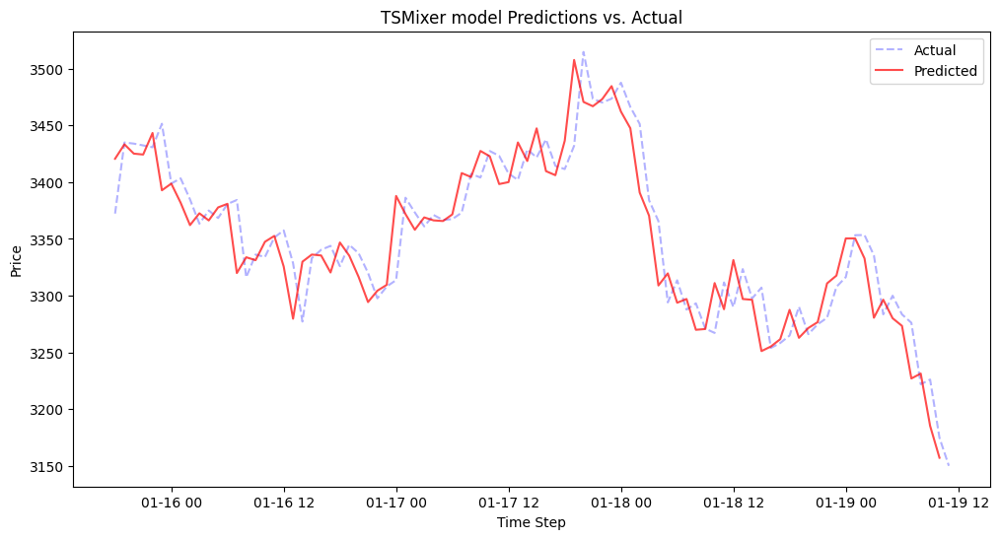

In [928]:
all_predictions = bt_best_params_test_data['TSMixerPredictions']
all_targets = bt_best_params_test_data['Close']
plot(all_predictions, all_targets, "TSMixer model Predictions vs. Actual")

In [929]:
class TechAnalysisWithTSMixerFilterStrategy(Strategy):
    def init(self) -> None:
        #self.data_loader = data_loader
        #self.model = model

        #self.forecasts = self.I(lambda: np.repeat(np.nan, len(self.data)), name='forecast')
        self.signal = self.I(lambda: self.data.Signal)
        self.tsmixer_prediction = self.I(lambda: self.data.TSMixerPredictions)
        self.previous_signal = 0

    def next(self) -> None:
        #if len(self.data) <= TSMIXER_CFG.WINDOW+1:
        #    return

        #scaled_prices = self.data_loader._make_dataset(
            #self.data_loader.scaler.transform(self.data.df[["Close"]][-(TSMIXER_CFG.WINDOW+1):]),
        #    self.data.df[["Close"]][-(TSMIXER_CFG.WINDOW+1):],
        #    shuffle=False
        #    )

        # predicted_close_price = self.data_loader.inverse_transform(
        #     self.model.predict(scaled_prices, verbose=0)[-1,:,:]
        #     )[0][0]
        #predicted_close_price = self.model.predict(scaled_prices, verbose=0)[-1,:,:][0][0]

        #self.forecasts[-1] = predicted_close_price
        
        current_signal = self.signal[-1]
        predicted_close_price = self.tsmixer_prediction[-1]

        if current_signal != self.previous_signal:
            if current_signal == 1 and self.data.Close[-1] < predicted_close_price:
                if self.position.is_short:
                    self.position.close()

                if not self.position.is_long:
                    self.buy()

            elif current_signal == -1 and self.data.Close[-1] > predicted_close_price:
                if self.position.is_long:
                    self.position.close()

                if not self.position.is_short:
                    self.sell()

            elif current_signal == 0:
                if self.data.Close[-1] < predicted_close_price:
                    if self.position.is_short:
                        self.position.close()
    
                    if not self.position.is_long:
                        self.buy()
                
                if self.data.Close[-1] > predicted_close_price:
                    if self.position.is_long:
                        self.position.close()
        
                    if not self.position.is_short:
                        self.sell()
                #if self.position:
                #    self.position.close()

        self.previous_signal = current_signal

In [930]:
bt_best_params_test_data

,Open,High,Low,Close,Volume,Signal,TSMixerPredictions
Datetime,,,,,,,
2024-12-19 11:00:00,3707.60000,3712.99000,3697.09000,3705.62000,11556.95390,0,3674.45776
2024-12-19 12:00:00,3705.62000,3710.20000,3674.40000,3679.73000,15833.57750,0,3674.09082
2024-12-19 13:00:00,3679.73000,3699.31000,3673.48000,3678.39000,23140.95210,0,3635.85669
2024-12-19 14:00:00,3678.39000,3702.51000,3634.34000,3638.59000,37906.70450,0,3612.83032
2024-12-19 15:00:00,3638.59000,3640.94000,3572.73000,3613.92000,61338.98430,-1,3618.14160
...,...,...,...,...,...,...,...
2025-01-19 07:00:00,3283.44000,3293.29000,3263.00000,3276.06000,25129.63590,-1,3226.95312
2025-01-19 08:00:00,3276.06000,3277.53000,3215.81000,3221.90000,47929.54510,-1,3231.28857
2025-01-19 09:00:00,3221.90000,3233.77000,3143.02000,3226.00000,105144.51170,-1,3185.18213


In [931]:
_ = run_backtest(bt_best_params_test_data, TechAnalysisWithTSMixerFilterStrategy)

Start                     2024-12-19 11:00:00
End                       2025-01-19 11:00:00
Duration                     31 days 00:00:00
Exposure Time [%]                    99.19463
Equity Final [$]                1514448.82816
Equity Peak [$]                 1514448.82816
Return [%]                           51.44488
Buy & Hold Return [%]               -14.99479
Return (Ann.) [%]                  6139.59486
Volatility (Ann.) [%]              4509.77070
Sharpe Ratio                          1.36140
Sortino Ratio                       279.77508
Calmar Ratio                        728.85399
Max. Drawdown [%]                    -8.42363
Avg. Drawdown [%]                    -1.85882
Max. Drawdown Duration        7 days 10:00:00
Avg. Drawdown Duration        0 days 20:00:00
# Trades                                   53
Win Rate [%]                         52.83019
Best Trade [%]                       10.43280
Worst Trade [%]                      -2.33419
Avg. Trade [%]                    